In [1]:
import os
import json
import argparse
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import datetime as dt
import numpy as np

from glob import glob
from matplotlib.ticker import PercentFormatter, EngFormatter
from jinja2 import Environment, FileSystemLoader
from pathlib import Path

In [2]:
run_directories = list(Path('output/').iterdir())[-6:-1]
plot_dir = 'figures/'
print(len(run_directories))
print(run_directories)

5
[PosixPath('output/1644294148'), PosixPath('output/1644296392'), PosixPath('output/1644298636'), PosixPath('output/1644303115'), PosixPath('output/1644381576')]


In [3]:
def read_cc_csv(data):
    with open(data['config']) as f:
        d = json.load(f)
    
    basetime = pd.to_datetime(d['Basetime'], unit='s').timestamp() * 1000
    df = pd.read_csv(
        data['cc_file'],
        index_col = 0,
        names = ['time', 'target'],
        header = None,
        usecols = [0, 1],
    )
    df.index = pd.to_datetime(df.index - basetime, unit='ms')
    df = df[df['target'] > 0]
    df = df.resample('500ms').mean()
    df['group'] = data['group']
    return df

def read_scream_delay_csv(data):
    with open(data['config']) as f:
        d = json.load(f)
    basetime = pd.to_datetime(d['Basetime'], unit='s').timestamp() * 1000
    df = pd.read_csv(
        data['cc_file'],
        index_col = 0,
        names = ['time', 'queue_delay'],
        header = None,
        usecols = [0, 2],
    )
    df.index = pd.to_datetime(df.index - basetime, unit='ms')
    df = df.resample('500ms').mean()
    df['group'] = data['group']
    return df

def read_scream_cwnd(data):
    with open(data['config']) as f:
        d = json.load(f)
    basetime = pd.to_datetime(d['Basetime'], unit='s').timestamp() * 1000
    df = pd.read_csv(
        data['cc_file'],
        index_col = 0,
        names = ['time', 'cwnd', 'bytes_in_flight'],
        header = None,
        usecols = [0, 4, 5],
    )
    df.index = pd.to_datetime(df.index - basetime, unit='ms')
    df['group'] = data['group']
    return df

def read_router_csv(data):
    with open(data['config']) as f:
        d = json.load(f)

    basetime = pd.to_datetime(d['Basetime'], unit='s').timestamp() * 1000
    df = pd.read_csv(
        data['router_file'],
        index_col = 0,
        names = ['time', 'bandwidth'],
        header = None,
        usecols = [0, 1],
    )
    df.index = pd.to_datetime(df.index - basetime, unit='ms')
    return df

def read_rtp(data):
    with open(data['config']) as f:
        d = json.load(f)

    basetime = pd.to_datetime(d['Basetime'], unit='s').timestamp() * 1000
    df = pd.read_csv(
        data['rtp'],
        index_col = 0,
        names = ['time', 'rate'],
        header = None,
        usecols = [0, 6],
    )
    df.index = pd.to_datetime(df.index - basetime, unit='ms')
    df['rate'] = df['rate'].apply(lambda x: x * 8)
    df = df.resample('1s').sum()
    return df

def read_psnr(data):
    df=pd.read_csv(
        data['file'],
        sep=r'[\s:]',
        engine='python',
        usecols=[1, 11],
        names=['n', 'psnr'],
    )
    df = df[np.isfinite(df).all(1)]
    df['group'] = data['group']
    return df

def read_ssim(data):
    df = pd.read_csv(
        data['file'],
        sep=r'[\s:]',
        engine='python',
        usecols=[1, 9],
        names=['n', 'ssim'],
    )
    df = df[np.isfinite(df).all(1)]
    df['group'] = data['group']
    return df

def read_rtp_loss(data):
    with open(data['config']) as f:
        d = json.load(f)

    basetime = pd.to_datetime(d['Basetime'], unit='s').timestamp() * 1000

    df_send = pd.read_csv(
        data['send_file'],
        index_col = 1,
        names = ['time_send', 'nr'],
        header = None,
        usecols = [0, 8],
    )
    df_receive = pd.read_csv(
        data['receive_file'],
        index_col = 1,
        names = ['time_receive', 'nr'],
        header = None,
        usecols = [0, 8],
    )

    df_all = df_send.merge(df_receive, on=['nr'], how='left', indicator=True)
    df_all.index = pd.to_datetime(df_all['time_send'] - basetime, unit='ms')
    df_all['lost'] = df_all['_merge'] == 'left_only'
    df_all = df_all.resample('1s').agg({'time_send': 'count', 'lost': 'sum'})
    df_all['loss_rate'] = df_all['lost'] / df_all['time_send']
    df_all['group'] = data['group']
    df_all.drop('time_send', axis=1, inplace=True)
    df_all.drop('lost', axis=1, inplace=True)
    return df_all

def read_rtp_latency(data):
    with open(data['config']) as f:
        d = json.load(f)

    basetime = pd.to_datetime(d['Basetime'], unit='s').timestamp() * 1000
    df_send = pd.read_csv(
        data['send_file'],
        index_col = 1,
        names = ['time_send', 'nr'],
        header = None,
        usecols = [0, 8],
    )
    df_receive = pd.read_csv(
        data['receive_file'],
        index_col = 1,
        names = ['time_receive', 'nr'],
        header = None,
        usecols = [0, 8],
    )
    df = df_send.merge(df_receive, on='nr')
    df['diff'] = (df['time_receive'] - df['time_send']) / 1000.0
    df.index = pd.to_datetime(df['time_send'] - basetime, unit='ms')
    df['group'] = data['group']
    df = df.resample('100ms').mean()
    return df

In [4]:
def read_qlog_bytes_sent_stream(data):
    qlog_files = glob(os.path.join(data['path'], '*.qlog'))
    file = qlog_files[0]
    
    stream = []
    with open(file) as f:
        for index, line in enumerate(f):
            event = json.loads(line.strip())
            if 'name' in event and event['name'] == 'transport:packet_sent':
                if 'data' in event and 'frames' in event['data']:
                    stream_frames = [frame for frame in event['data']['frames'] if frame['frame_type'] == 'stream' ]
                    if len(stream_frames) > 0:
                        stream.append({'time': event['time'], 'bytes': sum([stream['length'] for stream in stream_frames])})

    stream_df = pd.DataFrame(stream)
    stream_df.index = pd.to_datetime(stream_df['time'], unit='ms')
    stream_df['bytes'] = stream_df['bytes'].apply(lambda x: x * 8)
    stream_df = stream_df.resample('1s').sum()
    stream_df.drop('time', axis=1, inplace=True)
    return stream_df

def read_qlog_bytes_sent_dgram(data):
    qlog_files = glob(os.path.join(data['path'], '*.qlog'))
    file = qlog_files[0]
    
    dgram = []
    with open(file) as f:
        for index, line in enumerate(f):
            event = json.loads(line.strip())
            if 'name' in event and event['name'] == 'transport:packet_sent':
                if 'data' in event and 'frames' in event['data']:
                    datagrams = [frame for frame in event['data']['frames'] if frame['frame_type'] == 'datagram' ]
                    if len(datagrams) > 0:
                        dgram.append({'time': event['time'], 'bytes': sum([datagram['length'] for datagram in datagrams])})

    datagram_df = pd.DataFrame(dgram)
    datagram_df.index = pd.to_datetime(datagram_df['time'], unit='ms')
    datagram_df['bytes'] = datagram_df['bytes'].apply(lambda x: x * 8)
    datagram_df = datagram_df.resample('1s').sum()
    datagram_df.drop('time', axis=1, inplace=True)
    return datagram_df

def read_qlog_bytes_sent_sum(data):
    qlog_files = glob(os.path.join(data['path'], '*.qlog'))
    file = qlog_files[0]
    
    sums = []
    with open(file) as f:
        for index, line in enumerate(f):
            event = json.loads(line.strip())
            if 'name' in event and event['name'] == 'transport:packet_sent':
                if 'data' in event and 'frames' in event['data']:
                    datagrams = [frame for frame in event['data']['frames'] if frame['frame_type'] == 'datagram' ]
                    stream_frames = [frame for frame in event['data']['frames'] if frame['frame_type'] == 'stream' ]
                    if len(datagrams) > 0:
                        sums.append({'time': event['time'], 'bytes': sum([datagram['length'] for datagram in datagrams])})
                    if len(stream_frames) > 0:
                        sums.append({'time': event['time'], 'bytes': sum([stream['length'] for stream in stream_frames])})

    sums_df = pd.DataFrame(sums)
    sums_df.index = pd.to_datetime(sums_df['time'], unit='ms')
    sums_df['bytes'] = sums_df['bytes'].apply(lambda x: x * 8)
    sums_df = sums_df.resample('1s').sum()
    sums_df.drop('time', axis=1, inplace=True)
    return sums_df

In [5]:
def qlog_bytes_sent(run_directories, path, dst_filename):
    filepaths = [{
        'path': os.path.join(d, path),
        'group': i,
    } for i, d in enumerate(run_directories)]
    stream_dfs = pd.concat(map(read_qlog_bytes_sent_stream, filepaths))
    dgram_dfs = pd.concat(map(read_qlog_bytes_sent_dgram, filepaths))
    sum_dfs = pd.concat(map(read_qlog_bytes_sent_sum, filepaths))
    
    stream_dfs = stream_dfs.groupby('time').mean()
    dgram_dfs = dgram_dfs.groupby('time').mean()
    sum_dfs = sum_dfs.groupby('time').mean()
    
    fig, ax = plt.subplots(figsize=(8,2), dpi=400)
    labels = []
    l1, = ax.plot(dgram_dfs.index, dgram_dfs['bytes'], label='Datagram Sent', linewidth=0.5)
    labels.append(l1)
    l2, = ax.plot(stream_dfs.index, stream_dfs['bytes'], label='Stream Sent', linewidth=0.5)
    labels.append(l2)
    l3, = ax.plot(sum_dfs.index, sum_dfs['bytes'], label='Sum Sent', linewidth=0.5)
    labels.append(l3)

    ax.set_xlabel('Time')
    ax.set_ylabel('Rate')

    ax.xaxis.set_major_formatter(mdates.DateFormatter("%M:%S"))
    ax.yaxis.set_major_formatter(EngFormatter(unit='bit/s'))
    ax.set_xlim([dt.datetime(1970, 1, 1), dt.datetime(1970, 1, 1, minute=1, second=45)])

    lgd = ax.legend(handles = labels, loc='upper right', bbox_to_anchor=(1, 1))
    fig.tight_layout()
    fig.savefig(dst_filename, bbox_extra_artists=(lgd,), bbox_inches='tight')

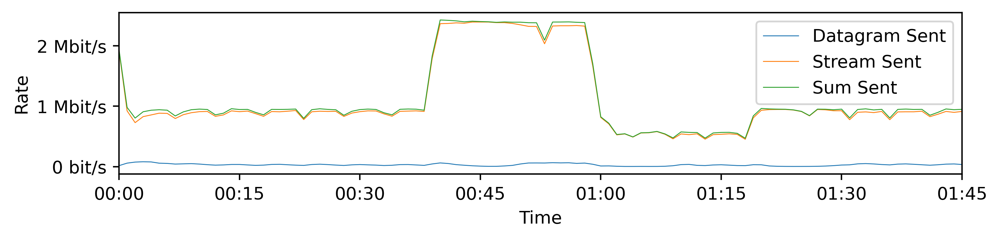

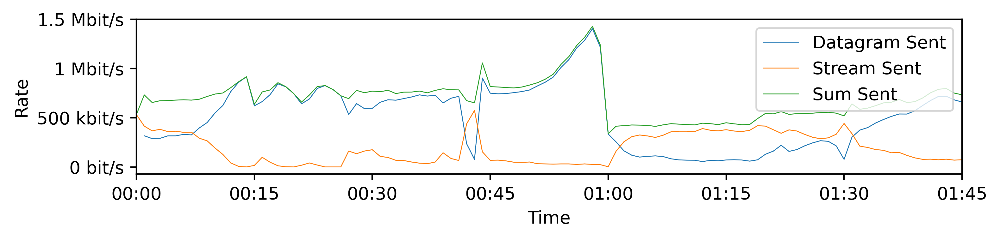

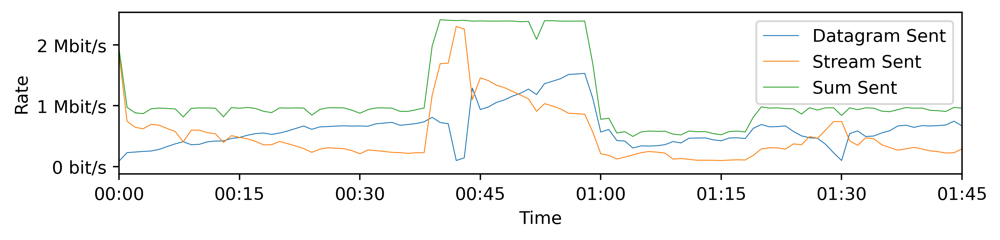

In [6]:
qlog_bytes_sent_plots = [
    {
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno-stream/sintel.y4m/forward_0/send_log/',
        'dst_filename': 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-scream-newreno-stream.sintel.y4m.qlog-shares.png',
    },
    {
        'path': 'VariableAvailableCapacitySingleFlow150msOWD/rtp-over-quic-prio-scream-newreno-stream/sintel.y4m/forward_0/send_log/',
        'dst_filename': 'VariableAvailableCapacitySingleFlow150msOWD.rtp-over-quic-prio-scream-newreno-stream.sintel.y4m.qlog-shares.png',
    },
    {
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-gcc-newreno-stream/sintel.y4m/forward_0/send_log/',
        'dst_filename': 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-gcc-newreno-stream.sintel.y4m.qlog-shares.png',
    },
]

for p in qlog_bytes_sent_plots:
    qlog_bytes_sent(run_directories, p['path'], os.path.join(plot_dir, p['dst_filename']))

In [7]:
def read_qlog_inflight(data):
    qlog_files = glob(os.path.join(data['path'], '*.qlog'))
    file = qlog_files[0]
    
    inflight = []
    with open(file) as f:
        for index, line in enumerate(f):
            event = json.loads(line.strip())
            if 'name' in event and event['name'] == 'recovery:metrics_updated':
                if 'data' in event and 'bytes_in_flight' in event['data']:
                    inflight.append({'time': event['time'], 'bytes_in_flight': event['data']['bytes_in_flight']})

    df_inflight = pd.DataFrame(inflight)
    df_inflight.index = pd.to_datetime(df_inflight['time'], unit='ms')
    df_inflight.drop('time', axis=1, inplace=True)
    return df_inflight
    
def read_qlog_cwnd(data):
    qlog_files = glob(os.path.join(data['path'], '*.qlog'))
    file = qlog_files[0]
    
    congestion = []
    with open(file) as f:
        for index, line in enumerate(f):
            event = json.loads(line.strip())
            if 'name' in event and event['name'] == 'recovery:metrics_updated':
                if 'data' in event and 'congestion_window' in event['data']:
                    congestion.append({'time': event['time'], 'cwnd': event['data']['congestion_window']})

    df_cwnd = pd.DataFrame(congestion)
    df_cwnd.index = pd.to_datetime(df_cwnd['time'], unit='ms')
    df_cwnd.drop('time', axis=1, inplace=True)
    return df_cwnd

In [8]:
def qlog_cwnd(run_directories, path, dst_filename):
    filepaths = [{
        'path': os.path.join(d, path),
        'group': i,
    } for i, d in enumerate(run_directories)]
    dfs_inflight = pd.concat(map(read_qlog_inflight, filepaths))
    dfs_inflight = dfs_inflight.resample('500ms').mean()
    dfs_inflight = dfs_inflight.groupby('time').mean()

    dfs_cwnd = pd.concat(map(read_qlog_cwnd, filepaths))
    dfs_cwnd = dfs_cwnd.resample('500ms').mean()
    dfs_cwnd = dfs_cwnd.groupby('time').mean()
    
    fig, ax = plt.subplots(figsize=(8,2), dpi=400)
    labels = []
    
    ax.set_xlabel('Time')
    ax.set_ylabel('Bytes')
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%M:%S"))
    ax.yaxis.set_major_formatter(EngFormatter(unit='Bytes'))
    ax.set_xlim([dt.datetime(1970, 1, 1), dt.datetime(1970, 1, 1, minute=1, second=45)])
    
    l0, = ax.plot(dfs_inflight.index, dfs_inflight['bytes_in_flight'], label='Bytes in Flight', linewidth=0.5)
    labels.append(l0)
    
    l1, = ax.plot(dfs_cwnd.index, dfs_cwnd['cwnd'], label='CWND', linewidth=0.5)
    labels.append(l1)
    
    lgd = ax.legend(handles = labels, loc='upper right', bbox_to_anchor=(1, 1))
    fig.savefig(dst_filename, bbox_extra_artists=(lgd,), bbox_inches='tight')

In [9]:
def qlog_cwnd_single(path, dst_filename):
    data = {
        'path': path,
        'group': 0,
    }
    dfs_inflight = read_qlog_inflight(data)
    dfs_cwnd = read_qlog_cwnd(data)
    
    # Hacky way to extend CWND plot till the end even if it does not log any changes anymore...
    last_time = dfs_inflight.iloc[[-1]].index[0]
    last_cwnd = dfs_cwnd.iloc[-1].values[0]
    dfs_cwnd = dfs_cwnd.append(pd.DataFrame({'cwnd': last_cwnd}, index=[last_time]))

    fig, ax = plt.subplots(figsize=(8,2), dpi=400)
    labels = []
    
    ax.set_xlabel('Time')
    ax.set_ylabel('Bytes')
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%M:%S"))
    ax.yaxis.set_major_formatter(EngFormatter(unit='Bytes'))
    ax.set_xlim([dt.datetime(1970, 1, 1), dt.datetime(1970, 1, 1, minute=1, second=45)])
    
    l0, = ax.plot(dfs_inflight.index, dfs_inflight['bytes_in_flight'], label='Bytes in Flight', linewidth=0.5)
    labels.append(l0)
    
    l1, = ax.plot(dfs_cwnd.index, dfs_cwnd['cwnd'], label='CWND', linewidth=0.5)
    labels.append(l1)
    
    lgd = ax.legend(handles = labels, loc='upper right', bbox_to_anchor=(1, 1))
    fig.savefig(dst_filename, bbox_extra_artists=(lgd,), bbox_inches='tight')

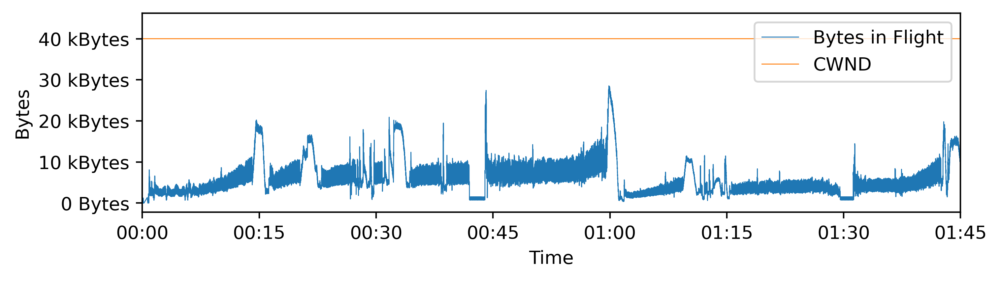

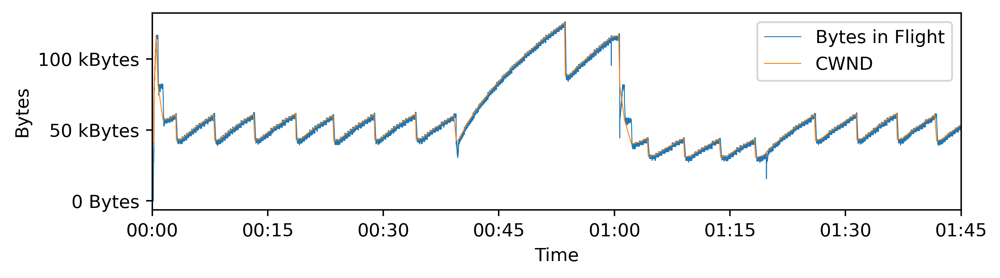

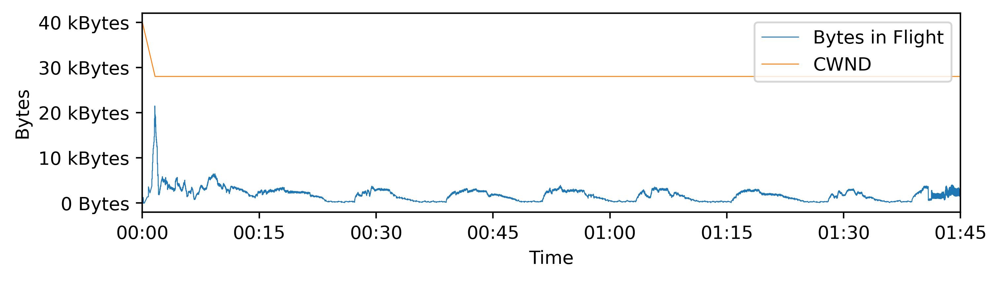

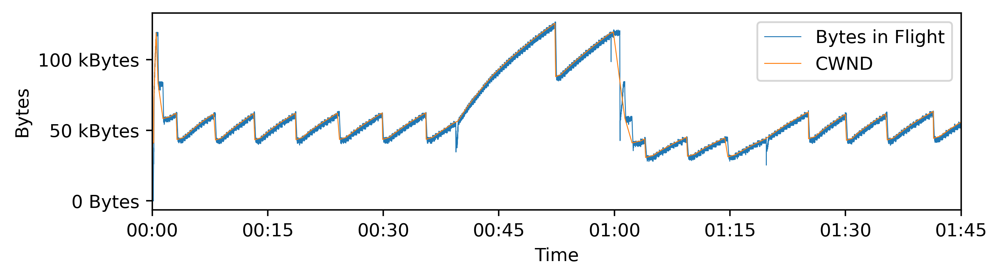

In [10]:
qlog_cwnd_single_plots = [
    {
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno/sintel.y4m/forward_0/send_log/',
        'dst_filename': 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-scream-newreno.sintel.y4m.qlog-cwnd.png',
    },
    {
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno-stream/sintel.y4m/forward_0/send_log/',
        'dst_filename': 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-scream-newreno-stream.sintel.y4m.qlog-cwnd.png',
    },
    {
        'path': 'MediaFlowCompetingWithALongTCPRenoFlow/rtp-over-quic-scream-newreno/sintel.y4m/forward_0/send_log/',
        'dst_filename': 'MediaFlowCompetingWithALongTCPRenoFlow.rtp-over-quic-scream-newreno.sintel.y4m.qlog-cwnd.png',
    },
    {
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-gcc-newreno-stream/sintel.y4m/forward_0/send_log/',
        'dst_filename': 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-gcc-newreno-stream.sintel.y4m.qlog-cwnd.png',
    },
]

for p in qlog_cwnd_single_plots:
    qlog_cwnd_single(os.path.join(run_directories[-1], p['path']), os.path.join(plot_dir, p['dst_filename']))

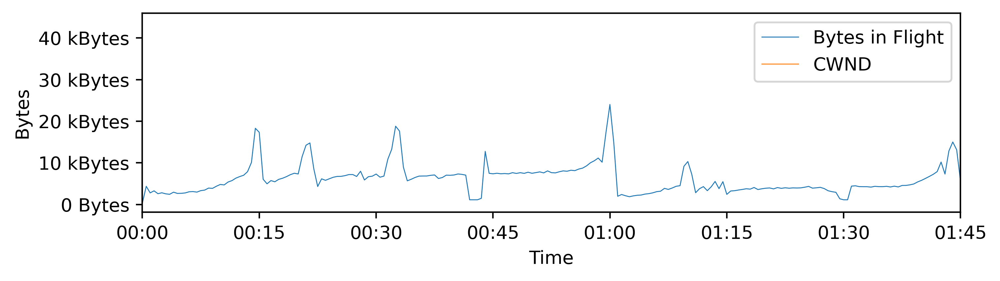

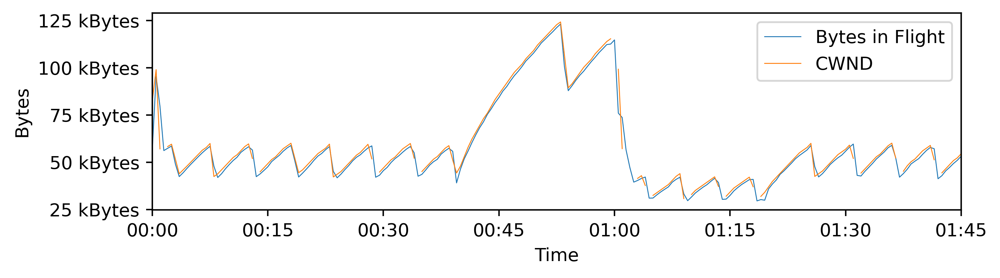

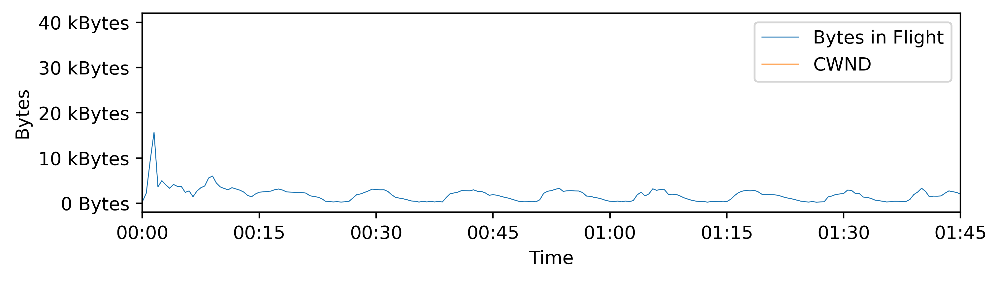

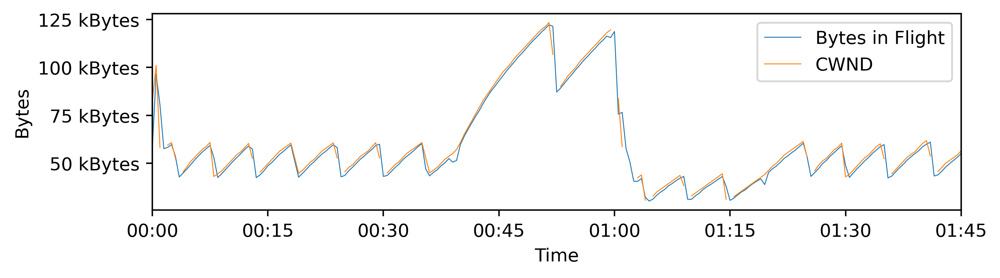

In [34]:
qlog_cwnd_plots = [
    {
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno/sintel.y4m/forward_0/send_log/',
        'dst_filename': 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-scream-newreno.sintel.y4m.qlog-cwnd.png',
    },
    {
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno-stream/sintel.y4m/forward_0/send_log/',
        'dst_filename': 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-scream-newreno-stream.sintel.y4m.qlog-cwnd.png',
    },
    {
        'path': 'MediaFlowCompetingWithALongTCPRenoFlow/rtp-over-quic-scream-newreno/sintel.y4m/forward_0/send_log/',
        'dst_filename': 'MediaFlowCompetingWithALongTCPRenoFlow.rtp-over-quic-scream-newreno.sintel.y4m.qlog-cwnd.png',
    },
    {
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-gcc-newreno-stream/sintel.y4m/forward_0/send_log/',
        'dst_filename': 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-gcc-newreno-stream.sintel.y4m.qlog-cwnd.png',
    },
]

for p in qlog_cwnd_plots:
    qlog_cwnd(run_directories[-1:], p['path'], os.path.join(plot_dir, p['dst_filename']))

In [12]:
def read_qlog_rtt(data):
    qlog_files = glob(os.path.join(data['path'], '*.qlog'))
    file = qlog_files[0]
    
    rtt = []
    with open(file) as f:
        for index, line in enumerate(f):
            event = json.loads(line.strip())
            if 'name' in event and event['name'] == 'recovery:metrics_updated':
                append = False
                sample = {'time': event['time']}
                if 'data' in event and 'smoothed_rtt' in event['data']:
                    sample['smoothed_rtt'] = event['data']['smoothed_rtt'] / 1000.0
                    append = True
                if 'data' in event and 'min_rtt' in event['data']:
                    sample['min_rtt'] = event['data']['min_rtt'] / 1000.0
                    append = True
                if 'data' in event and 'latest_rtt' in event['data']:
                    sample['latest_rtt'] = event['data']['latest_rtt'] / 1000.0
                    append = True
                if append:
                    rtt.append(sample)

    df = pd.DataFrame(rtt)
    df.index = pd.to_datetime(df['time'], unit='ms')
    return df

In [13]:
def qlog_rtt(run_directories, path, dst_filename):
    filepaths = [{
        'path': os.path.join(d, path),
        'group': i,
    } for i, d in enumerate(run_directories)]
    dfs = pd.concat(map(read_qlog_rtt, filepaths))
    dfs = dfs.groupby(dfs.index).mean()
    
    fig, ax = plt.subplots(figsize=(8,2), dpi=400)
    labels = []
    
    ax.set_xlabel('Time')
    ax.set_ylabel('RTT')
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%M:%S"))
    ax.yaxis.set_major_formatter(EngFormatter(unit='s'))
    ax.set_xlim([dt.datetime(1970, 1, 1), dt.datetime(1970, 1, 1, minute=1, second=45)])

    l, = ax.plot(dfs.index, dfs['latest_rtt'], label='RTT', linewidth=0.5)
    labels.append(l)
    lgd = ax.legend(handles = labels, loc='upper right', bbox_to_anchor=(1, 1))
    fig.tight_layout()
    fig.savefig(dst_filename, bbox_extra_artists=(lgd,), bbox_inches='tight')

In [14]:
def qlog_rtt_single(path, dst_filename):
    data = {
        'path': path,
        'group': 0,
    }
    dfs = read_qlog_rtt(data)
    dfs = dfs.groupby(dfs.index).mean()
    
    fig, ax = plt.subplots(figsize=(8,2), dpi=400)
    labels = []
    
    ax.set_xlabel('Time')
    ax.set_ylabel('RTT')
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%M:%S"))
    ax.yaxis.set_major_formatter(EngFormatter(unit='s'))
    ax.set_xlim([dt.datetime(1970, 1, 1), dt.datetime(1970, 1, 1, minute=1, second=45)])

    l, = ax.plot(dfs.index, dfs['latest_rtt'], label='RTT', linewidth=0.5)
    labels.append(l)
    lgd = ax.legend(handles = labels, loc='upper right', bbox_to_anchor=(1, 1))
    fig.tight_layout()
    fig.savefig(dst_filename, bbox_extra_artists=(lgd,), bbox_inches='tight')

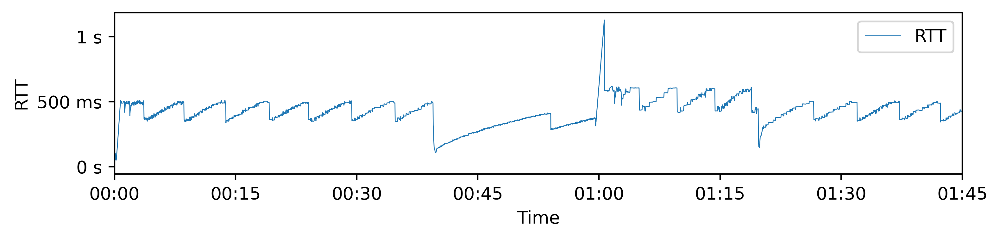

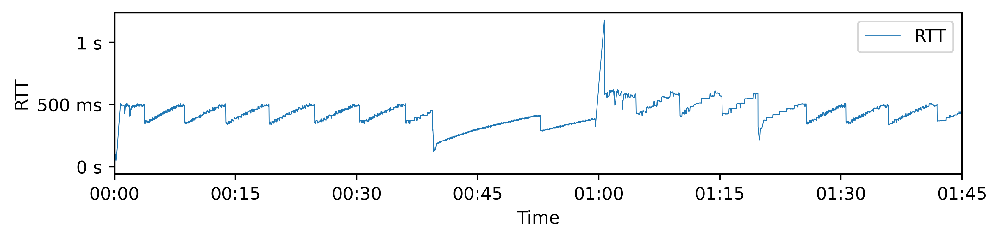

In [15]:
qlog_rtt_single_plots = [
    {
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno-stream/sintel.y4m/forward_0/send_log/',
        'dst_filename': 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-scream-newreno-stream.sintel.y4m.qlog-rtt.png',
    },
    {
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-gcc-newreno-stream/sintel.y4m/forward_0/send_log/',
        'dst_filename': 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-gcc-newreno-stream.sintel.y4m.qlog-rtt.png',
    },
]

for p in qlog_rtt_single_plots:
    qlog_rtt_single(os.path.join(run_directories[-1], p['path']), os.path.join(plot_dir, p['dst_filename']))

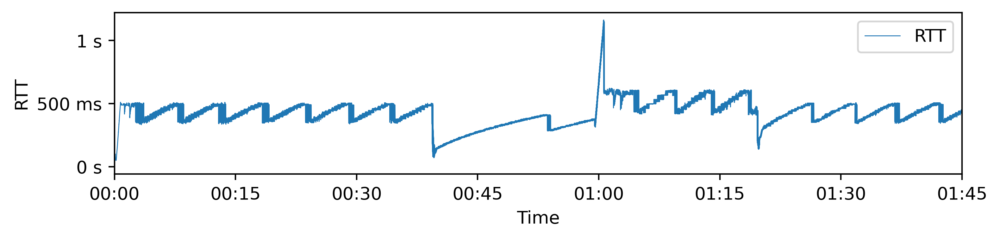

In [33]:
qlog_rtt_plots = [
    {
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno-stream/sintel.y4m/forward_0/send_log/',
        'dst_filename': 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-scream-newreno-stream.sintel.y4m.qlog-rtt.png',
    },
]

for p in qlog_rtt_plots:
    qlog_rtt(run_directories, p['path'], os.path.join(plot_dir, p['dst_filename']))

In [17]:
def video_quality(run_directories, path):
    filepaths = [{
        'file': os.path.join(d, os.path.join(path, 'ssim.log')),
        'group': i
    } for i, d in enumerate(run_directories)]
    
    not_found = [x for x in filepaths if not os.path.exists(x['file'])]
    if len(not_found) > 0:
        print('WARNING, FILES NOT FOUND: {}'.format(not_found))
    filepaths = [x for x in filepaths if os.path.exists(x['file'])]

    dfs = pd.concat(map(read_ssim, filepaths))
    ssim_mean = dfs.groupby('group').mean().mean()
    ssim_stddev = dfs.groupby('group').mean().std()
    
    filepaths = [{
        'file': os.path.join(d, os.path.join(path, 'psnr.log')),
        'group': i
    } for i, d in enumerate(run_directories)]
    
    not_found = [x for x in filepaths if not os.path.exists(x['file'])]
    if len(not_found) > 0:
        print('WARNING, FILES NOT FOUND: {}'.format(not_found))
    filepaths = [x for x in filepaths if os.path.exists(x['file'])]

    dfs = pd.concat(map(read_psnr, filepaths))
    psnr_mean = dfs.groupby('group').mean().mean()
    psnr_stddev = dfs.groupby('group').mean().std()
    
    return {
        'ssim_mean': ssim_mean['ssim'],
        'ssim_stddev': ssim_stddev['ssim'],
        'psnr_mean': psnr_mean['psnr'],
        'psnr_stddev': psnr_stddev['psnr']
    }

In [53]:
def rates(run_directories, config_filename, router_filename, cc_filename, dst_filename):
    # Rates
    filepaths = [{
        'cc_file': os.path.join(d, cc_filename),
        'router_file': os.path.join(d, router_filename),
        'config': os.path.join(d, config_filename),
        'group': i
    } for i, d in enumerate(run_directories)]

    dfs = pd.concat(map(read_cc_csv, filepaths))
    
    router_dfs = list(map(read_router_csv, filepaths))
    # Choose one router, as they all hopefully do the same
    router_df = router_dfs[0]

#     fig, ax = plt.subplots(figsize=(8,2), dpi=400)
#     l, = ax.step(router_df.index, router_df.values, where='post', label='Capacity', linewidth=0.5)
#     for i in range(len(list(filepaths))):
#         df = dfs[dfs['group']==i]
#         l, = ax.plot(df.index, df['target'], label='Target Bitrate ' + str(i), linewidth=0.5)
#         next_df = dfs[dfs['group']==(i+1)%len(list(filepaths))]
#         ax.fill_between(df.head(118).index, df.head(118)['target'], next_df.head(118)['target'], color='grey', alpha=0.5)

#     ax.set_xlabel('Time')
#     ax.set_ylabel('Rate')
#     ax.xaxis.set_major_formatter(mdates.DateFormatter("%M:%S"))
#     ax.yaxis.set_major_formatter(EngFormatter(unit='bit/s'))
#     ax.set_xlim([dt.datetime(1970, 1, 1), dt.datetime(1970, 1, 1, minute=1, second=45)])
    
    mean_df = dfs.groupby('group').mean()
    max_group = mean_df.idxmax()
    min_group = mean_df.idxmin()
    
    fig, ax = plt.subplots(figsize=(6,2), dpi=400)
    labels = []
    ax.set_xlabel('Time')
    ax.set_ylabel('Rate')
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%M:%S"))
    ax.yaxis.set_major_formatter(EngFormatter(unit='bit/s'))
    ax.set_xlim([dt.datetime(1970, 1, 1), dt.datetime(1970, 1, 1, minute=1, second=45)])
    
#     max_df = dfs[dfs['group']==int(max_group)]
#     l, = ax.plot(max_df.index, max_df['target'], label='Max Mean', linewidth=0.5)
#     labels.append(l)
#     min_df = dfs[dfs['group']==int(min_group)]
#     l, = ax.plot(min_df.index, min_df['target'], label='Min Mean', linewidth=0.5)
#     labels.append(l)

    dfs = dfs.groupby('time').agg(['min', 'max', 'mean'])
    l, = ax.plot(dfs.index, dfs['target']['min'], label='Min', linewidth=0.5)
    labels.append(l)
    l, = ax.plot(dfs.index, dfs['target']['max'], label='Max', linewidth=0.5)
    labels.append(l)
    l, = ax.plot(dfs.index, dfs['target']['mean'], label='Mean', linewidth=0.5)
    labels.append(l)
    ax.fill_between(dfs.index, dfs['target']['min'], dfs['target']['max'], color='grey', alpha=0.5)

    l, = ax.step(router_df.index, router_df.values, where='post', label='Capacity', linewidth=0.5, color='0')
    labels.append(l)

    lgd = ax.legend(handles = labels, fontsize='small', loc='upper right', bbox_to_anchor=(1, 1), ncol=2)
    fig.tight_layout()

    fig.savefig(dst_filename, bbox_extra_artists=(lgd,), bbox_inches='tight')

In [19]:
def sent_received_rates(run_directories, config_filename, path, router_filename, dst_filename):
    fig, ax = plt.subplots(figsize=(8,2), dpi=400)
    labels = []
    ax.set_xlabel('Time')
    ax.set_ylabel('Rate')
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%M:%S"))
    ax.yaxis.set_major_formatter(EngFormatter(unit='bit/s'))
    ax.set_xlim([dt.datetime(1970, 1, 1), dt.datetime(1970, 1, 1, minute=1, second=45)])
    
    # Rates
    filepaths = [{
        'config': os.path.join(d, config_filename),
        'rtp': os.path.join(d, path, 'send_log', 'rtp_out.log'),
        'router_file': os.path.join(d, router_filename),
        'group': i
    } for i, d in enumerate(run_directories)]

    sent_dfs = pd.concat(map(read_rtp, filepaths))
    
    router_dfs = list(map(read_router_csv, filepaths))
    # Choose one router, as they all hopefully do the same
    router_df = router_dfs[0]
    
    filepaths = [{
        'config': os.path.join(d, config_filename),
        'rtp': os.path.join(d, path, 'receive_log', 'rtp_in.log'),
        'group': i
    } for i, d in enumerate(run_directories)]

    received_dfs = pd.concat(map(read_rtp, filepaths))
    
    sent_dfs = sent_dfs.groupby('time').agg(['mean'])
    l, = ax.plot(sent_dfs.index, sent_dfs['rate']['mean'], linestyle='dotted', label='Sent', linewidth=0.5)
    labels.append(l)
    
    received_dfs = received_dfs.groupby('time').agg(['mean'])
    l, = ax.plot(received_dfs.index, received_dfs['rate']['mean'], linestyle='dashed', label='Received', linewidth=0.5)
    labels.append(l)

    l, = ax.step(router_df.index, router_df.values, where='post', label='Capacity', linewidth=0.5, color='grey')
    labels.append(l)
    
    lgd = ax.legend(handles = labels, loc='upper right', bbox_to_anchor=(1, 1), ncol=2)
    fig.tight_layout()

    fig.savefig(dst_filename, bbox_extra_artists=(lgd,), bbox_inches='tight')

In [20]:
def loss(run_directories, config_filename, path, dst_filename):
    fig, ax = plt.subplots(figsize=(8,2), dpi=400)
    labels = []
    ax.set_xlabel('Time')
    ax.set_ylabel('Packets Lost')
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%M:%S"))
    ax.yaxis.set_major_formatter(PercentFormatter(xmax=1.0))
    ax.set_xlim([dt.datetime(1970, 1, 1), dt.datetime(1970, 1, 1, minute=1, second=45)])
    
    # Rates
    filepaths = [{
        'config': os.path.join(d, config_filename),
        'send_file': os.path.join(d, path, 'send_log', 'rtp_out.log'),
        'receive_file': os.path.join(d, path, 'receive_log', 'rtp_in.log'),
        'group': i
    } for i, d in enumerate(run_directories)]

    dfs = pd.concat(map(read_rtp_loss, filepaths))
    dfs = dfs.groupby(dfs.index).mean()
    l, = ax.plot(dfs.index, dfs['loss_rate'], label='Loss', linewidth=0.5)
    labels.append(l)
    
    lgd = ax.legend(handles = labels, loc='upper right', bbox_to_anchor=(1, 1), ncol=1)
    fig.tight_layout()
    fig.savefig(dst_filename, bbox_extra_artists=(lgd,), bbox_inches='tight')

In [21]:
def queue_delay(run_directories, config_filename, router_filename, scream_filename, dst_filename):
    filepaths = [{
        'cc_file': os.path.join(d, scream_filename),
        'router_file': os.path.join(d, router_filename),
        'config': os.path.join(d, config_filename),
        'group': i
    } for i, d in enumerate(run_directories)]
    delay_dfs = pd.concat(map(read_scream_delay_csv, filepaths))
    target_dfs = pd.concat(map(read_cc_csv, filepaths))
    router_dfs = list(map(read_router_csv, filepaths))
    router_df = router_dfs[0]
    
    fig, ax = plt.subplots(figsize=(8,2), dpi=400)
    color = 'tab:blue'
    labels = []
    
    dfs = delay_dfs.groupby('time').agg(['min', 'max', 'mean'])
    l, = ax.plot(dfs.index, dfs['queue_delay']['mean'], label='Mean Delay', linewidth=0.5, color=color)
    labels.append(l)
    
    ax.set_xlabel('Time')
    ax.set_ylabel('Delay', color=color)
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%M:%S"))
    ax.yaxis.set_major_formatter(EngFormatter(unit='s'))
    ax.set_xlim([dt.datetime(1970, 1, 1), dt.datetime(1970, 1, 1, minute=1, second=45)])
#     lgd = ax.legend(handles = labels, loc='upper right', bbox_to_anchor=(1, 1), ncol=2)
    
    ax2 = ax.twinx()
    color = 'tab:red'
    
    l, = ax2.step(router_df.index, router_df.values, where='post', label='Capacity', linewidth=0.5, color=color)
    labels.append(l)

    dfs = target_dfs.groupby('time').agg(['mean'])
    l, = ax2.plot(dfs.index, dfs['target']['mean'], label='Mean Target Bitrate', linewidth=0.5, color='g')
    labels.append(l)

    ax2.set_ylabel('Rate', color=color)
    ax2.yaxis.set_major_formatter(EngFormatter(unit='bit/s'))
    lgd = ax2.legend(handles = labels, loc='upper right', bbox_to_anchor=(1, 1), ncol=1)

    fig.tight_layout()
    fig.savefig(dst_filename, bbox_extra_artists=(lgd,), bbox_inches='tight')

In [38]:
def latency(run_directories, config_filename, path, router_filename, cc_filename, dst_filename):
    fig, ax = plt.subplots(figsize=(6,2), dpi=400)
    labels = []
    
    grey = 'tab:grey'
    red = 'tab:red'
    blue = 'tab:blue'
    
    ax.set_xlabel('Time')
    ax.set_ylabel('Latency', color=blue)
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%M:%S"))
    ax.yaxis.set_major_formatter(EngFormatter(unit='s'))
    ax.set_xlim([dt.datetime(1970, 1, 1), dt.datetime(1970, 1, 1, minute=1, second=45)])
    
    ax2 = ax.twinx()
    ax2.set_ylabel('Target Rate', color=red)
    ax2.yaxis.set_major_formatter(EngFormatter(unit='bit/s'))
    
    filepaths = [{
        'config': os.path.join(d, config_filename),
        'send_file': os.path.join(d, path, 'send_log', 'rtp_out.log'),
        'receive_file': os.path.join(d, path, 'receive_log', 'rtp_in.log'),
        'router_file': os.path.join(d, router_filename),
        'cc_file': os.path.join(d, cc_filename),
        'group': i
    } for i, d in enumerate(run_directories)]
    
    latency_dfs = pd.concat(map(read_rtp_latency, filepaths))
    target_dfs = pd.concat(map(read_cc_csv, filepaths))
    router_dfs = list(map(read_router_csv, filepaths))
    router_df = router_dfs[0]
    
    latency_dfs = latency_dfs.groupby(latency_dfs.index).mean()
    l, = ax.plot(latency_dfs.index, latency_dfs['diff'], linewidth=0.5, color=blue)
#     labels.append(l)

    dfs = target_dfs.groupby('time').agg(['mean'])
    l, = ax2.plot(dfs.index, dfs['target']['mean'], linewidth=0.5, color=red)
#     labels.append(l)
    
    l, = ax2.step(router_df.index, router_df.values, where='post', label='Capacity', linewidth=0.5, color='0')
    labels.append(l)
    
    lgd = ax.legend(handles = labels, loc='upper right', bbox_to_anchor=(1, 1), ncol=1)
    fig.tight_layout()
    fig.savefig(dst_filename, bbox_extra_artists=(lgd,), bbox_inches='tight')

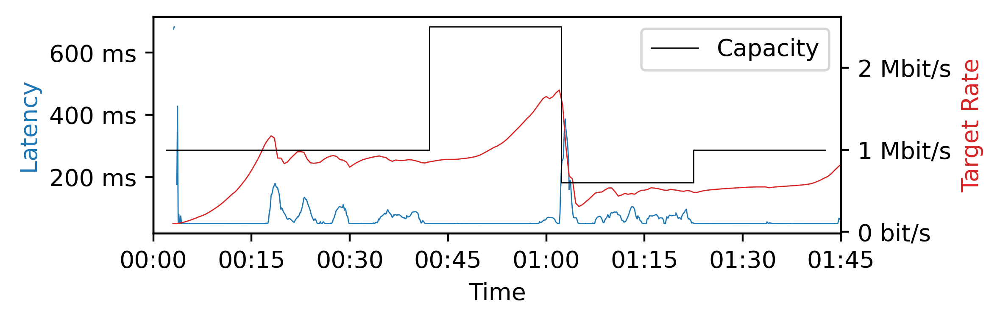

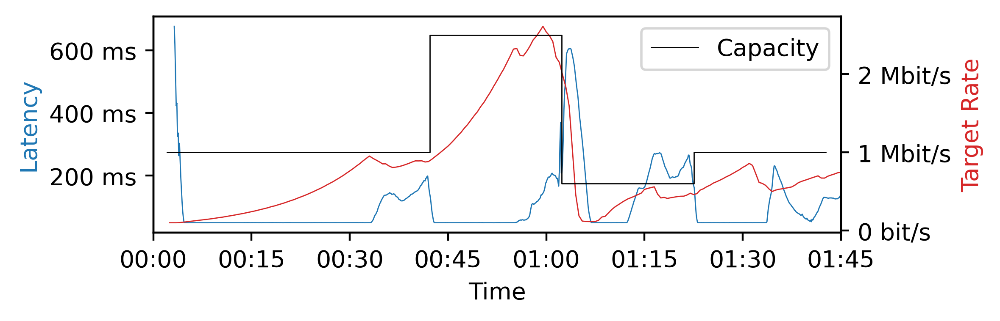

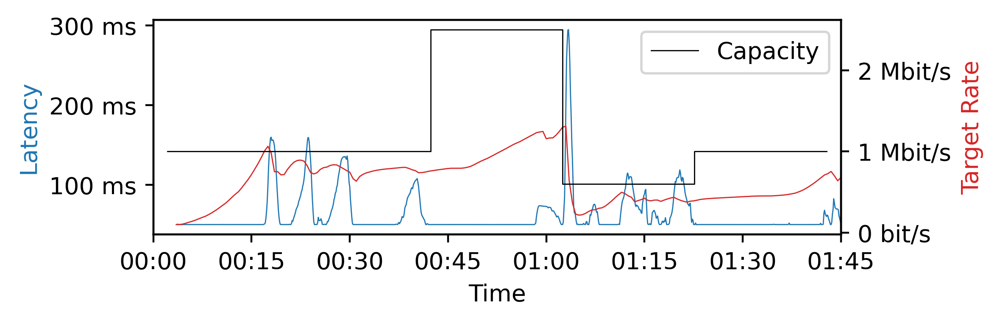

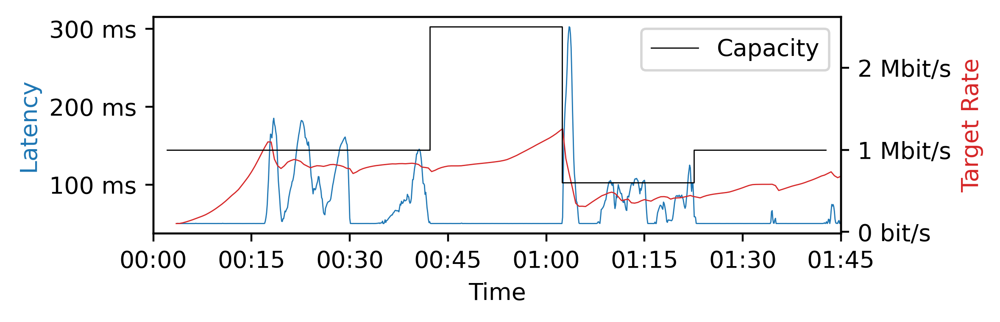

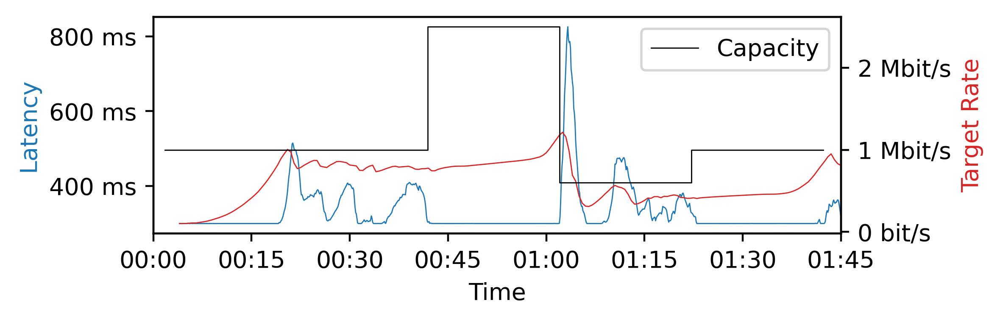

...

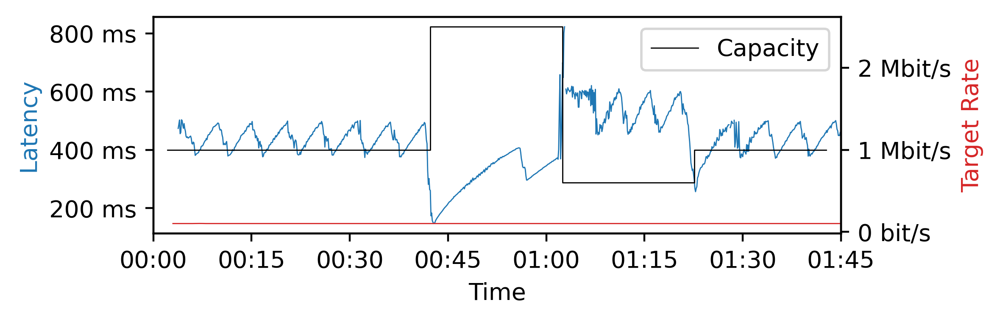

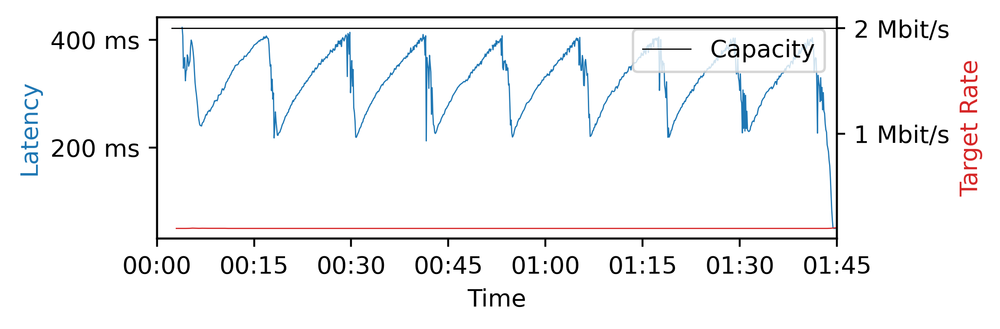

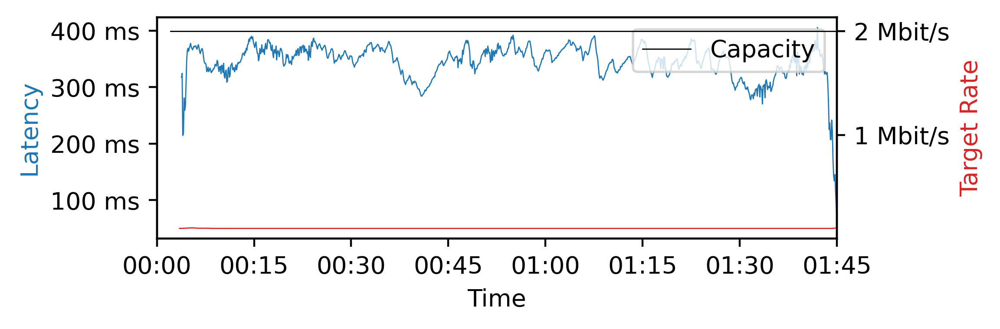

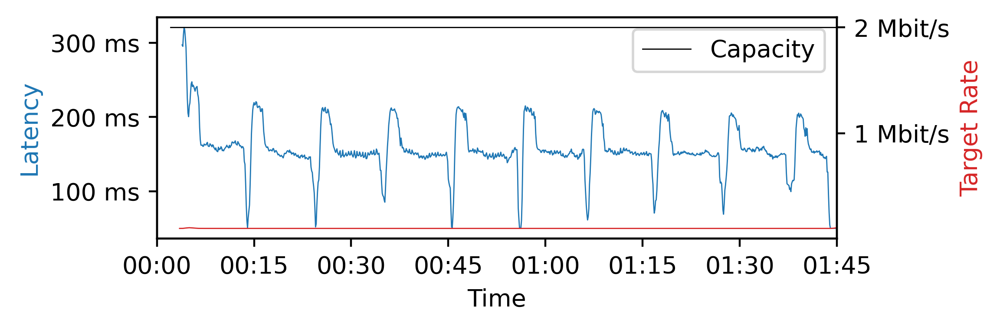

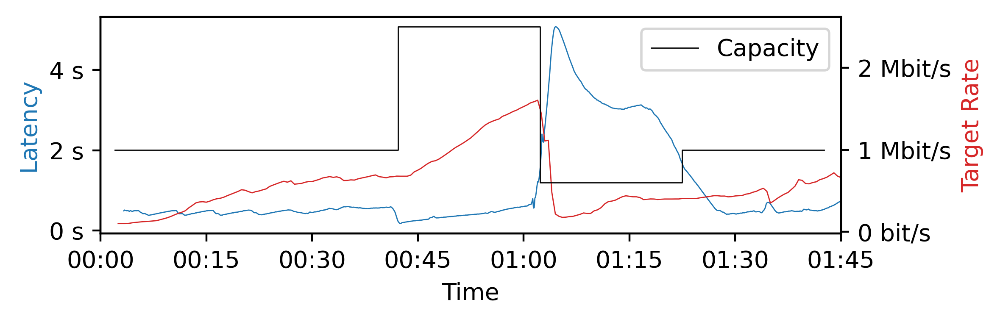

In [39]:
latency_plots = [
    {
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/sintel.y4m/leftrouter.log',
        'cc_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/sintel.y4m/forward_0/send_log/scream.log',
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/sintel.y4m/forward_0',
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/sintel.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-udp-scream.sintel.y4m.latency.png')
    },
    {
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-gcc/sintel.y4m/config.json',
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-gcc/sintel.y4m/forward_0',
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-gcc/sintel.y4m/leftrouter.log',
        'cc_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-gcc/sintel.y4m/forward_0/send_log/gcc.log',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-udp-gcc.sintel.y4m.latency.png')
    },
    {
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream/sintel.y4m/leftrouter.log',
        'cc_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream/sintel.y4m/forward_0/send_log/scream.log',
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream/sintel.y4m/forward_0',
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream/sintel.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-scream.sintel.y4m.latency.png')
    },
    {
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/leftrouter.log',
        'cc_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/forward_0/send_log/scream.log',
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/forward_0',
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-scream-local-feedback.sintel.y4m.latency.png')
    },
    {
        'router_filename': 'VariableAvailableCapacitySingleFlow300msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/leftrouter.log',
        'cc_filename': 'VariableAvailableCapacitySingleFlow300msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/forward_0/send_log/scream.log',
        'path': 'VariableAvailableCapacitySingleFlow300msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/forward_0',
        'config_filename': 'VariableAvailableCapacitySingleFlow300msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow300msOWD.rtp-over-quic-scream-local-feedback.sintel.y4m.latency.png')
    },
    {
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno/sintel.y4m/leftrouter.log',
        'cc_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno/sintel.y4m/forward_0/send_log/scream.log',
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno/sintel.y4m/forward_0',
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno/sintel.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-scream-newreno.sintel.y4m.latency.png')
    },
    {
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno-stream/sintel.y4m/leftrouter.log',
        'cc_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno-stream/sintel.y4m/forward_0/send_log/scream.log',
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno-stream/sintel.y4m/forward_0',
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno-stream/sintel.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-scream-newreno-stream.sintel.y4m.latency.png')
    },
    {
        'router_filename': 'MediaFlowCompetingWithALongTCPRenoFlow/rtp-over-quic-scream-newreno/sintel.y4m/leftrouter.log',
        'cc_filename': 'MediaFlowCompetingWithALongTCPRenoFlow/rtp-over-quic-scream-newreno/sintel.y4m/forward_0/send_log/scream.log',
        'path': 'MediaFlowCompetingWithALongTCPRenoFlow/rtp-over-quic-scream-newreno/sintel.y4m/forward_0',
        'config_filename': 'MediaFlowCompetingWithALongTCPRenoFlow/rtp-over-quic-scream-newreno/sintel.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'MediaFlowCompetingWithALongTCPRenoFlow.rtp-over-quic-scream-newreno.sintel.y4m.latency.png')
    },
    {
        'router_filename': 'MediaFlowCompetingWithALongTCPCubicFlow/rtp-over-quic-scream-newreno/sintel.y4m/leftrouter.log',
        'cc_filename': 'MediaFlowCompetingWithALongTCPCubicFlow/rtp-over-quic-scream-newreno/sintel.y4m/forward_0/send_log/scream.log',
        'path': 'MediaFlowCompetingWithALongTCPCubicFlow/rtp-over-quic-scream-newreno/sintel.y4m/forward_0',
        'config_filename': 'MediaFlowCompetingWithALongTCPCubicFlow/rtp-over-quic-scream-newreno/sintel.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'MediaFlowCompetingWithALongTCPCubicFlow.rtp-over-quic-scream-newreno.sintel.y4m.latency.png')
    },
    {
        'router_filename': 'MediaFlowCompetingWithALongTCPBBRFlow/rtp-over-quic-scream-newreno/sintel.y4m/leftrouter.log',
        'cc_filename': 'MediaFlowCompetingWithALongTCPBBRFlow/rtp-over-quic-scream-newreno/sintel.y4m/forward_0/send_log/scream.log',
        'path': 'MediaFlowCompetingWithALongTCPBBRFlow/rtp-over-quic-scream-newreno/sintel.y4m/forward_0',
        'config_filename': 'MediaFlowCompetingWithALongTCPBBRFlow/rtp-over-quic-scream-newreno/sintel.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'MediaFlowCompetingWithALongTCPBBRFlow.rtp-over-quic-scream-newreno.sintel.y4m.latency.png')
    },
    {
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-gcc-newreno-stream/sintel.y4m/config.json',
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-gcc-newreno-stream/sintel.y4m/forward_0',
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-gcc-newreno-stream/sintel.y4m/leftrouter.log',
        'cc_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-gcc-newreno-stream/sintel.y4m/forward_0/send_log/gcc.log',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-gcc-newreno-stream.sintel.y4m.latency.png')
    },
]

for p in latency_plots:
    latency(run_directories, p['config_filename'], p['path'], p['router_filename'], p['cc_filename'], p['dst_filename'])

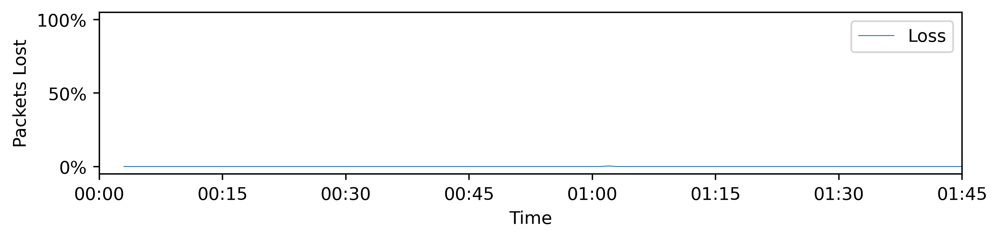

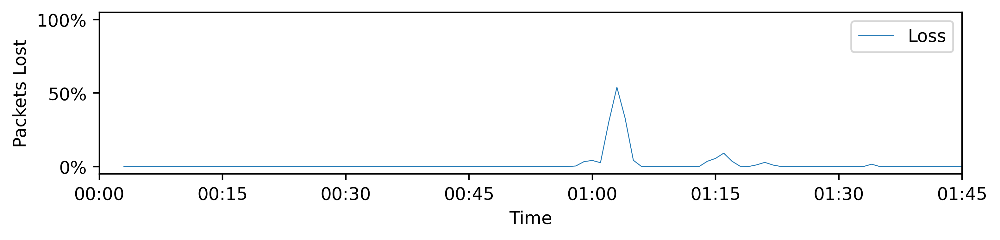

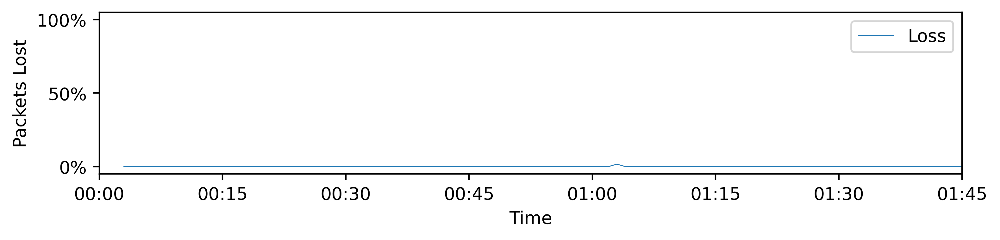

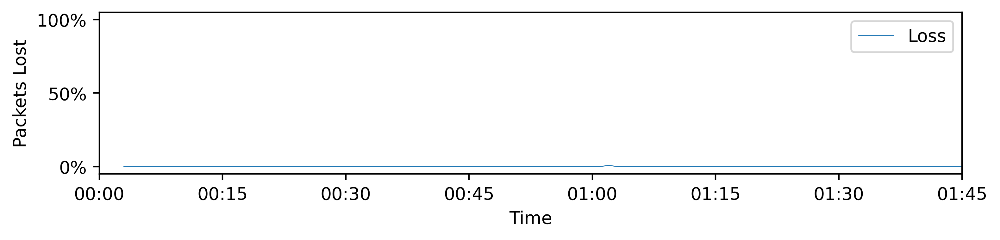

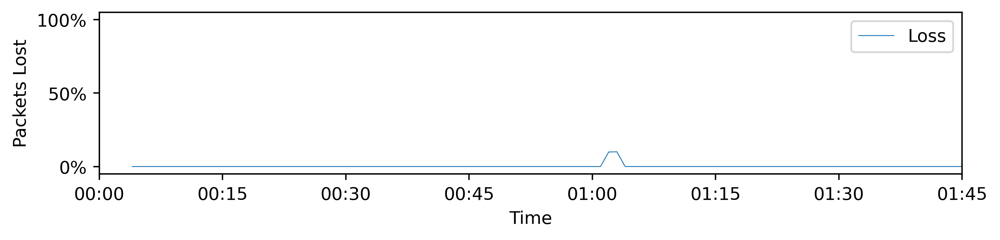

...

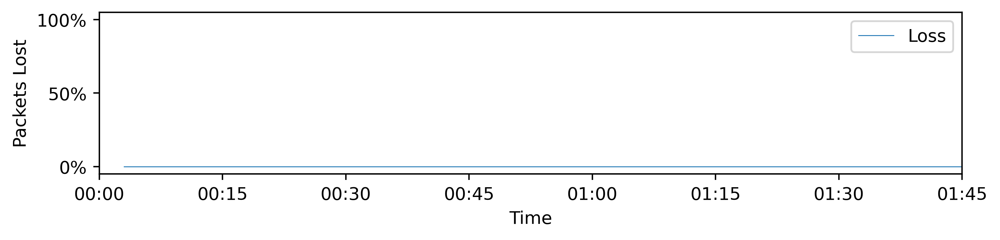

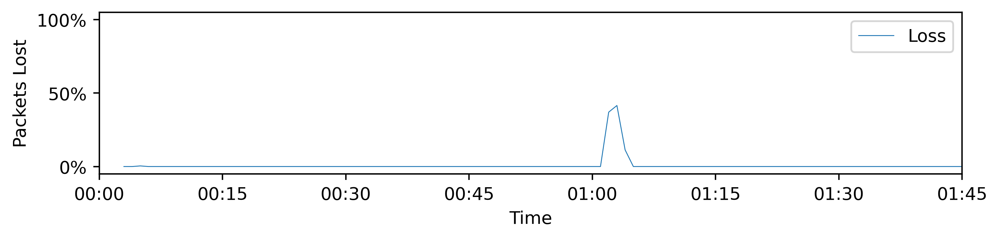

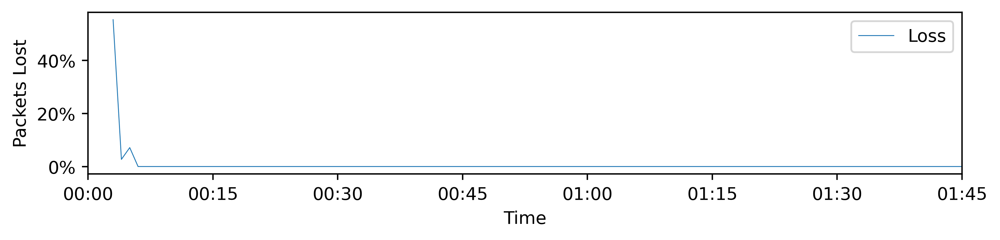

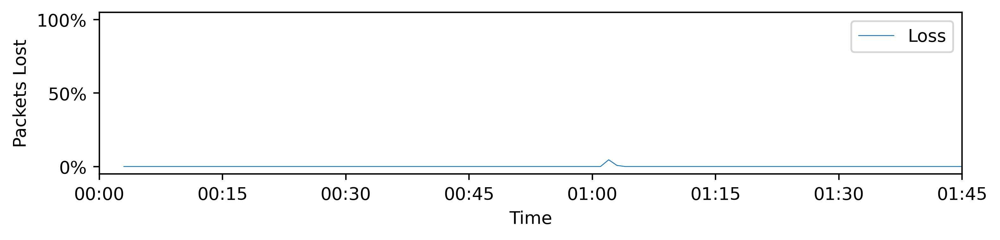

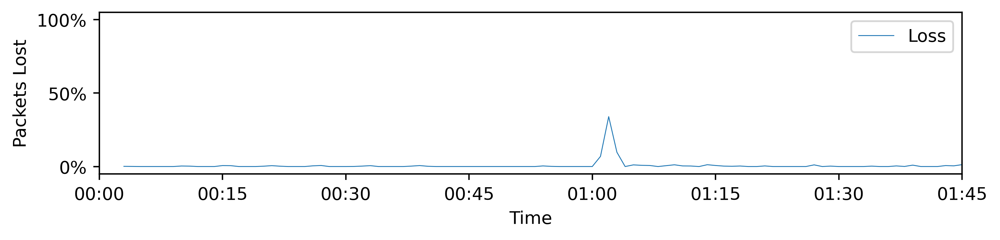

In [24]:
loss_plots = [
    {
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/sintel.y4m/config.json',
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/sintel.y4m/forward_0',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-udp-scream.sintel.y4m.loss.png')
    },
    {
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-gcc/sintel.y4m/config.json',
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-gcc/sintel.y4m/forward_0',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-udp-gcc.sintel.y4m.loss.png')
    },
    {
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream/sintel.y4m/config.json',
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream/sintel.y4m/forward_0',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-scream.sintel.y4m.loss.png')
    },
    {
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/config.json',
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/forward_0',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-scream-local-feedback.sintel.y4m.loss.png')
    },
    {
        'config_filename': 'VariableAvailableCapacitySingleFlow300msOWD/rtp-over-quic-scream/sintel.y4m/config.json',
        'path': 'VariableAvailableCapacitySingleFlow300msOWD/rtp-over-quic-scream/sintel.y4m/forward_0',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow300msOWD.rtp-over-quic-scream.sintel.y4m.loss.png')
    },
    {
        'config_filename': 'VariableAvailableCapacitySingleFlow300msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/config.json',
        'path': 'VariableAvailableCapacitySingleFlow300msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/forward_0',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow300msOWD.rtp-over-quic-scream-local-feedback.sintel.y4m.loss.png')
    },
    {
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno/sintel.y4m/config.json',
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno/sintel.y4m/forward_0',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-scream-newreno.sintel.y4m.loss.png')
    },
    {
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno-stream/sintel.y4m/config.json',
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno-stream/sintel.y4m/forward_0',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-scream-newreno-stream.sintel.y4m.loss.png')
    },
    {
        'config_filename': 'MediaFlowCompetingWithALongTCPRenoFlow/rtp-over-quic-scream-newreno/sintel.y4m/config.json',
        'path': 'MediaFlowCompetingWithALongTCPRenoFlow/rtp-over-quic-scream-newreno/sintel.y4m/forward_0',
        'dst_filename': os.path.join(plot_dir, 'MediaFlowCompetingWithALongTCPRenoFlow.rtp-over-quic-scream-newreno.sintel.y4m.loss.png')
    },
    {
        'config_filename': 'VariableAvailableCapacitySingleFlow150msOWD/rtp-over-quic-prio-scream-newreno-stream/sintel.y4m/config.json',
        'path': 'VariableAvailableCapacitySingleFlow150msOWD/rtp-over-quic-prio-scream-newreno-stream/sintel.y4m/forward_0',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow150msOWD.rtp-over-quic-prio-scream-newreno-stream.sintel.y4m.loss.png')
    },
    {
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-gcc-newreno-stream/sintel.y4m/config.json',
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-gcc-newreno-stream/sintel.y4m/forward_0',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-gcc-newreno-stream.sintel.y4m.loss.png')
    },
]

for p in loss_plots:
    loss(run_directories, p['config_filename'], p['path'], p['dst_filename'])

In [25]:
files = [
    'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/sintel.y4m/forward_0',
    'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-gcc/sintel.y4m/forward_0',
    'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream/sintel.y4m/forward_0',
    'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/forward_0',
    'VariableAvailableCapacitySingleFlow300msOWD/rtp-over-quic-scream/sintel.y4m/forward_0',
    'VariableAvailableCapacitySingleFlow300msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/forward_0',
    'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno/sintel.y4m/forward_0',
    'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-gcc-newreno-stream/sintel.y4m/forward_0',
]

for f in files:
    print('{}:'.format(f))
    print(json.dumps(video_quality(run_directories, f), sort_keys=True, indent=4))
    print()

VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/sintel.y4m/forward_0:
{
    "psnr_mean": 17.9780975285882,
    "psnr_stddev": 0.26493846469053184,
    "ssim_mean": 0.7635429436130566,
    "ssim_stddev": 0.002903965221985722
}

VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-gcc/sintel.y4m/forward_0:
{
    "psnr_mean": 36.657029280658314,
    "psnr_stddev": 2.3925591001677753,
    "ssim_mean": 0.9178329170116527,
    "ssim_stddev": 0.02287145674131684
}

VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream/sintel.y4m/forward_0:
{
    "psnr_mean": 21.083572473668493,
    "psnr_stddev": 0.20679938128067946,
    "ssim_mean": 0.7871989189575317,
    "ssim_stddev": 0.0020851640215645935
}

VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/forward_0:
{
    "psnr_mean": 22.449953849854293,
    "psnr_stddev": 0.7247886635862444,
    "ssim_mean": 0.801713619058414,
    "ssim_stddev": 0.00681971380764303
}

Variab

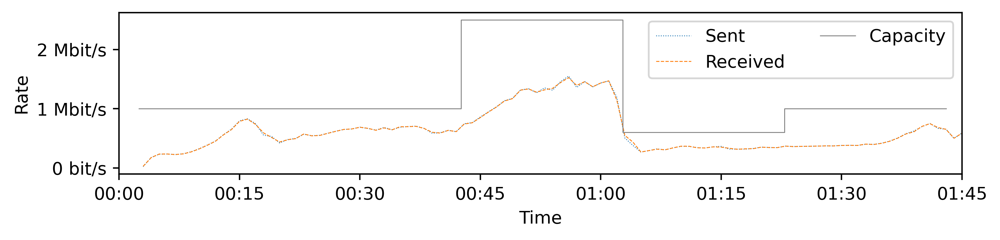

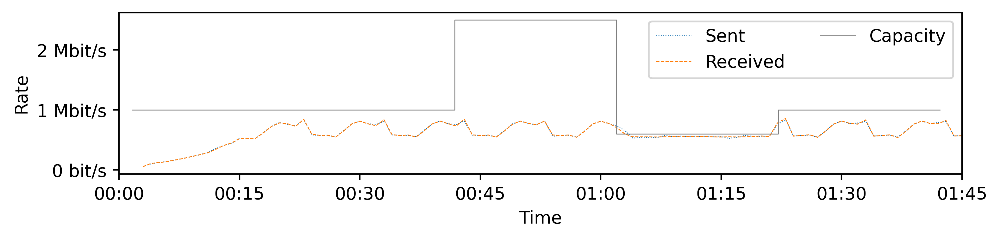

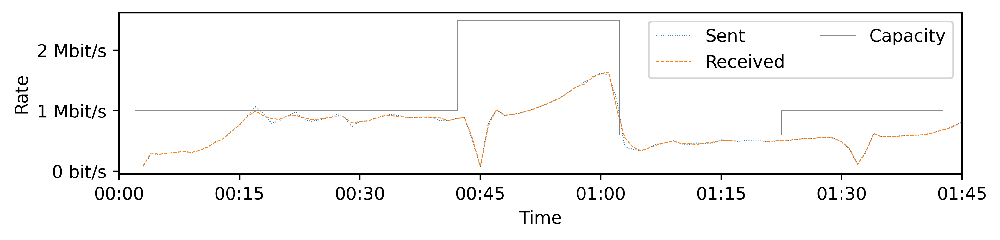

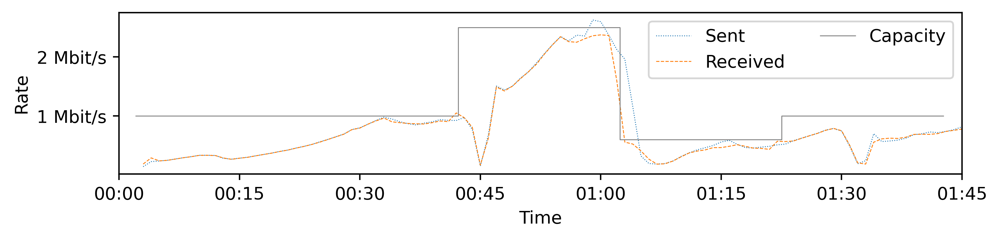

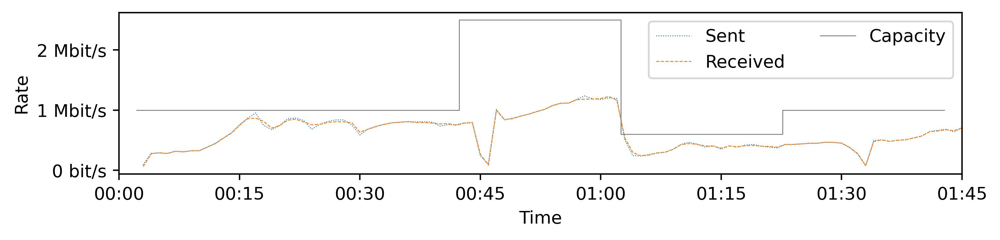

...

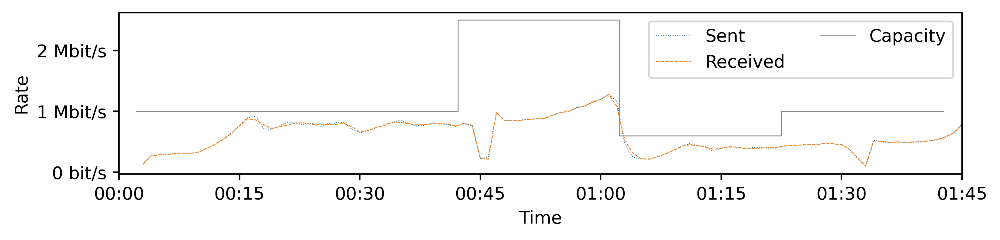

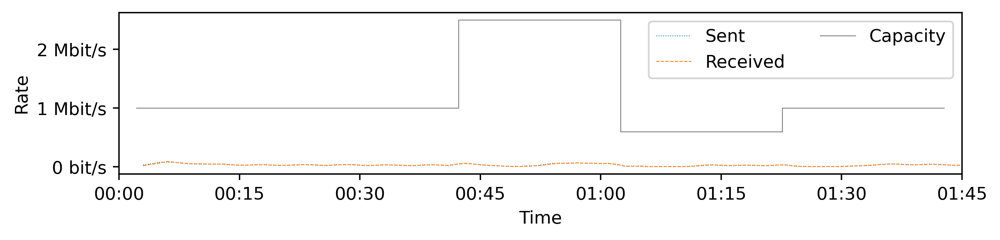

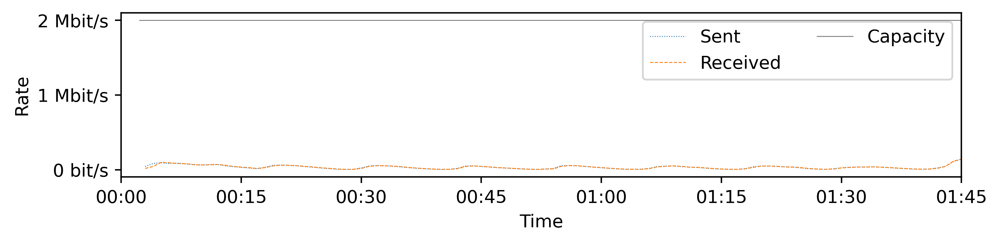

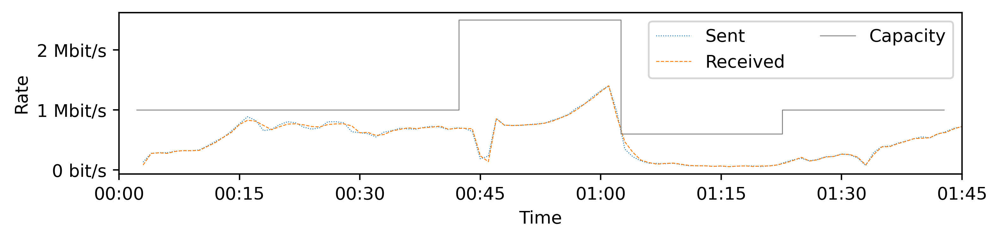

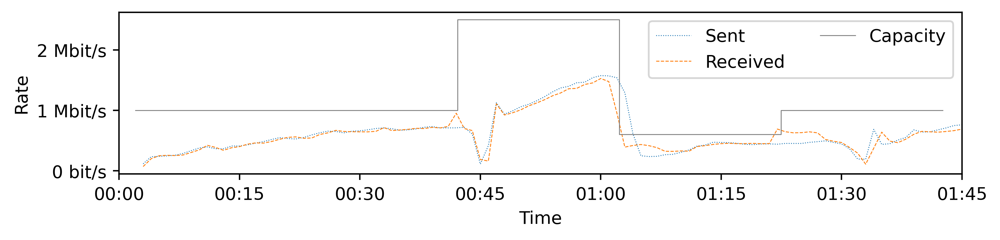

In [26]:
sent_received_plots = [
    {
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/FourPeople_concat.y4m/config.json',
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/FourPeople_concat.y4m/forward_0',
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/FourPeople_concat.y4m/leftrouter.log',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-udp-scream.FourPeople_concat.y4m.sent-received.png')
    },
    {
        'config_filename':  'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/foreman_concat.y4m/config.json',
        'path':  'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/foreman_concat.y4m/forward_0',
        'router_filename':  'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/foreman_concat.y4m/leftrouter.log',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-udp-scream.foreman_concat.y4m.sent-received.png')
    },
    {
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/sintel.y4m/config.json',
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/sintel.y4m/forward_0',
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/sintel.y4m/leftrouter.log',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-udp-scream.sintel.y4m.sent-received.png')
    },
    {
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-gcc/sintel.y4m/config.json',
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-gcc/sintel.y4m/forward_0',
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-gcc/sintel.y4m/leftrouter.log',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-udp-gcc.sintel.y4m.sent-received.png')
    },
    {
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream/sintel.y4m/config.json',
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream/sintel.y4m/forward_0',
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream/sintel.y4m/leftrouter.log',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-scream.sintel.y4m.sent-received.png')
    },
    {
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/config.json',
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/forward_0',
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/leftrouter.log',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-scream-local-feedback.sintel.y4m.sent-received.png')
    },
    {
        'config_filename': 'VariableAvailableCapacitySingleFlow300msOWD/rtp-over-quic-scream/sintel.y4m/config.json',
        'path': 'VariableAvailableCapacitySingleFlow300msOWD/rtp-over-quic-scream/sintel.y4m/forward_0',
        'router_filename': 'VariableAvailableCapacitySingleFlow300msOWD/rtp-over-quic-scream/sintel.y4m/leftrouter.log',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow300msOWD.rtp-over-quic-scream.sintel.y4m.sent-received.png')
    },
    {
        'config_filename': 'VariableAvailableCapacitySingleFlow300msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/config.json',
        'path': 'VariableAvailableCapacitySingleFlow300msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/forward_0',
        'router_filename': 'VariableAvailableCapacitySingleFlow300msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/leftrouter.log',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow300msOWD.rtp-over-quic-scream-local-feedback.sintel.y4m.sent-received.png')
    },
    {
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno/sintel.y4m/config.json',
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno/sintel.y4m/forward_0',
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno/sintel.y4m/leftrouter.log',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-scream-newreno.sintel.y4m.sent-received.png')
    },
    {
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno-stream/sintel.y4m/config.json',
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno-stream/sintel.y4m/forward_0',
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno-stream/sintel.y4m/leftrouter.log',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-scream-newreno-stream.sintel.y4m.sent-received.png')
    },
    {
        'config_filename': 'MediaFlowCompetingWithALongTCPRenoFlow/rtp-over-quic-scream-newreno/sintel.y4m/config.json',
        'path': 'MediaFlowCompetingWithALongTCPRenoFlow/rtp-over-quic-scream-newreno/sintel.y4m/forward_0',
        'router_filename': 'MediaFlowCompetingWithALongTCPRenoFlow/rtp-over-quic-scream-newreno/sintel.y4m/leftrouter.log',
        'dst_filename': os.path.join(plot_dir, 'MediaFlowCompetingWithALongTCPRenoFlow.rtp-over-quic-scream-newreno.sintel.y4m.sent-received.png')
    },
    {
        'config_filename': 'VariableAvailableCapacitySingleFlow150msOWD/rtp-over-quic-prio-scream-newreno-stream/sintel.y4m/config.json',
        'path': 'VariableAvailableCapacitySingleFlow150msOWD/rtp-over-quic-prio-scream-newreno-stream/sintel.y4m/forward_0',
        'router_filename': 'VariableAvailableCapacitySingleFlow150msOWD/rtp-over-quic-prio-scream-newreno-stream/sintel.y4m/leftrouter.log',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow150msOWD.rtp-over-quic-prio-scream-newreno-stream.sintel.y4m.sent-received.png')
    },
    {
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-gcc-newreno-stream/sintel.y4m/config.json',
        'path': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-gcc-newreno-stream/sintel.y4m/forward_0',
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-gcc-newreno-stream/sintel.y4m/leftrouter.log',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-gcc-newreno-stream.sintel.y4m.sent-received.png')
    },
]

for p in sent_received_plots:
    sent_received_rates(run_directories, p['config_filename'], p['path'], p['router_filename'], p['dst_filename'])

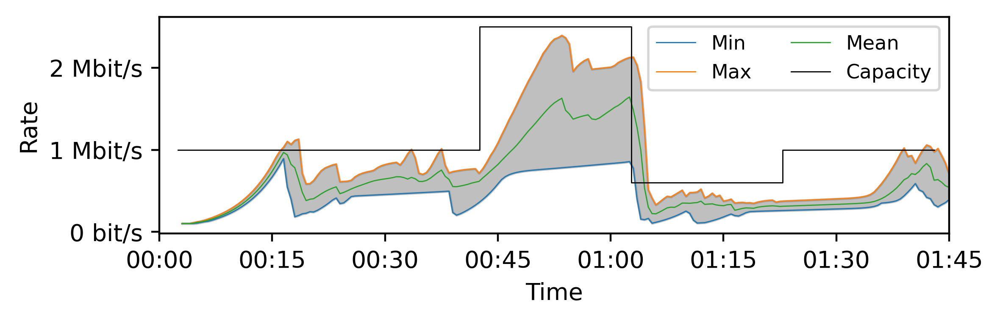

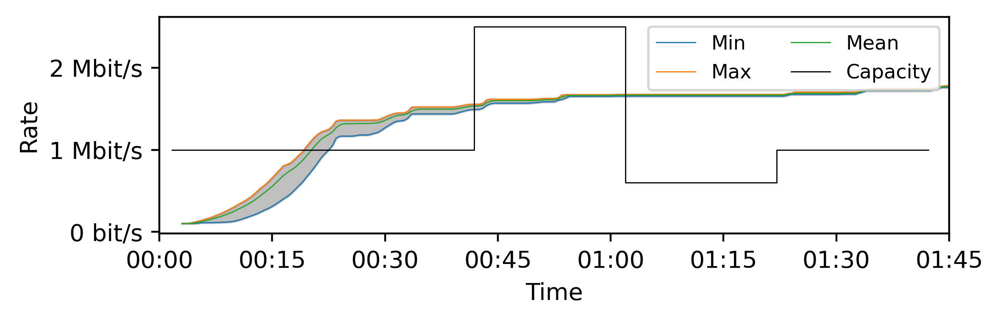

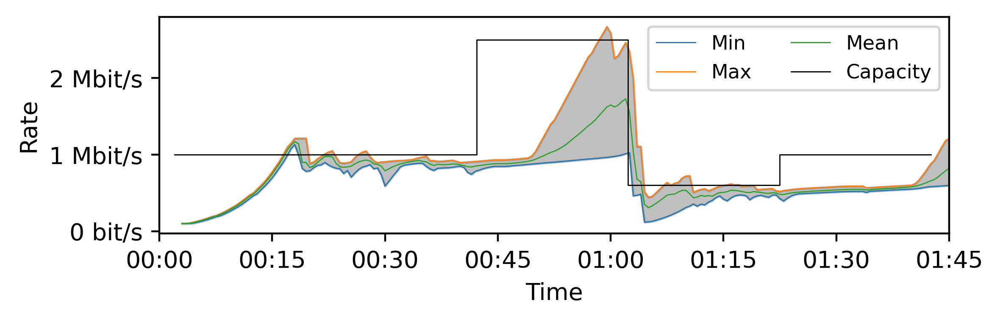

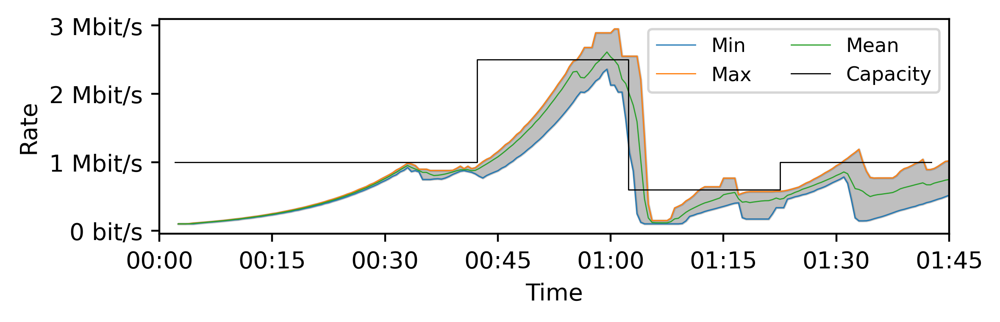

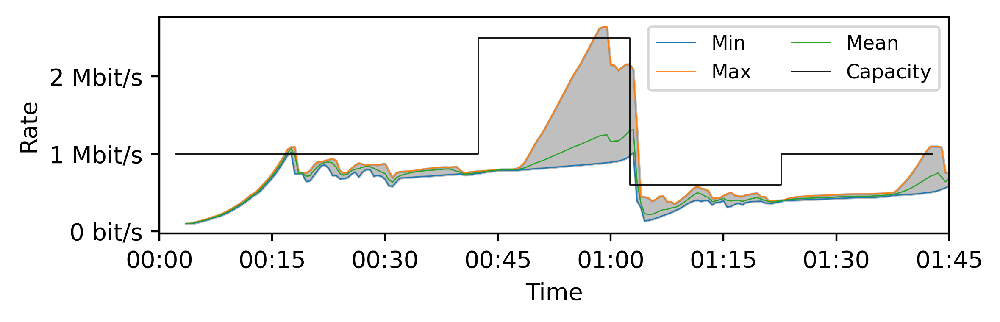

...

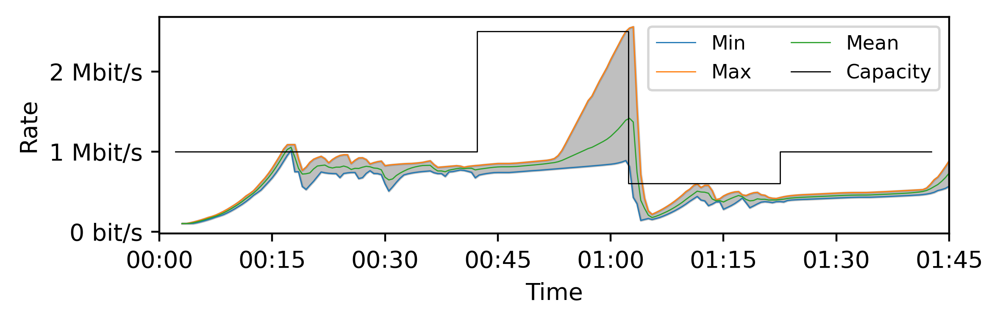

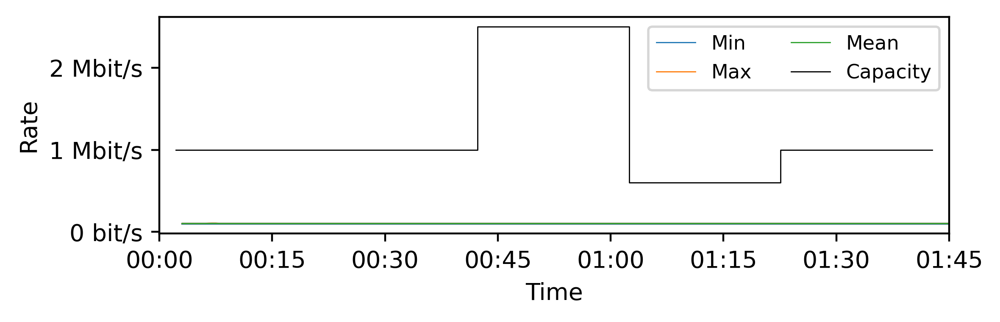

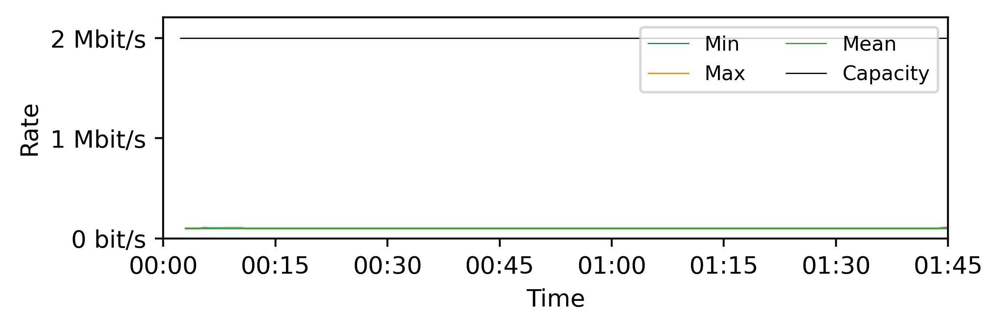

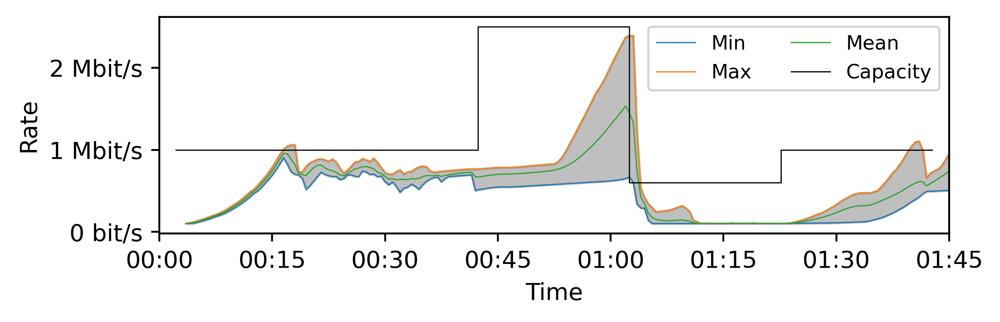

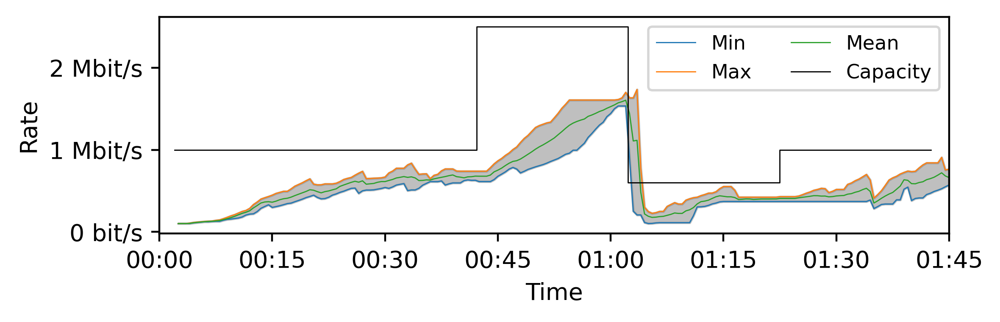

In [54]:
# Figure 1: RTP over UDP SCReAM all videos
rates_plots = [
    {
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/FourPeople_concat.y4m/leftrouter.log',
        'cc_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/FourPeople_concat.y4m/forward_0/send_log/scream.log',
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/FourPeople_concat.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-udp-scream.FourPeople_concat.y4m.rates.png')
    },
    {
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/foreman_concat.y4m/leftrouter.log',
        'cc_filename':  'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/foreman_concat.y4m/forward_0/send_log/scream.log',
        'config_filename':  'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/foreman_concat.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-udp-scream.foreman_concat.y4m.rates.png')
    },
    {
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/sintel.y4m/leftrouter.log',
        'cc_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/sintel.y4m/forward_0/send_log/scream.log',
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/sintel.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-udp-scream.sintel.y4m.rates.png')
    },
    {
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-gcc/sintel.y4m/leftrouter.log',
        'cc_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-gcc/sintel.y4m/forward_0/send_log/gcc.log',
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-gcc/sintel.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-udp-gcc.sintel.y4m.rates.png')
    },
    {
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream/sintel.y4m/leftrouter.log',
        'cc_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream/sintel.y4m/forward_0/send_log/scream.log',
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream/sintel.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-scream.sintel.y4m.rates.png')
    },
    {
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/leftrouter.log',
        'cc_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/forward_0/send_log/scream.log',
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-scream-local-feedback.sintel.y4m.rates.png')
    },
    {
        'router_filename': 'VariableAvailableCapacitySingleFlow300msOWD/rtp-over-quic-scream/sintel.y4m/leftrouter.log',
        'cc_filename': 'VariableAvailableCapacitySingleFlow300msOWD/rtp-over-quic-scream/sintel.y4m/forward_0/send_log/scream.log',
        'config_filename': 'VariableAvailableCapacitySingleFlow300msOWD/rtp-over-quic-scream/sintel.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow300msOWD.rtp-over-quic-scream.sintel.y4m.rates.png')
    },
    {
        'router_filename': 'VariableAvailableCapacitySingleFlow300msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/leftrouter.log',
        'cc_filename': 'VariableAvailableCapacitySingleFlow300msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/forward_0/send_log/scream.log',
        'config_filename': 'VariableAvailableCapacitySingleFlow300msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow300msOWD.rtp-over-quic-scream-local-feedback.sintel.y4m.rates.png')
    },
    {
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno/sintel.y4m/leftrouter.log',
        'cc_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno/sintel.y4m/forward_0/send_log/scream.log',
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno/sintel.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-scream-newreno.sintel.y4m.rates.png')
    },
    {
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno-stream/sintel.y4m/leftrouter.log',
        'cc_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno-stream/sintel.y4m/forward_0/send_log/scream.log',
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno-stream/sintel.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-scream-newreno-stream.sintel.y4m.rates.png')
    },
    {
        'router_filename': 'MediaFlowCompetingWithALongTCPRenoFlow/rtp-over-quic-scream-newreno/sintel.y4m/leftrouter.log',
        'cc_filename': 'MediaFlowCompetingWithALongTCPRenoFlow/rtp-over-quic-scream-newreno/sintel.y4m/forward_0/send_log/scream.log',
        'config_filename': 'MediaFlowCompetingWithALongTCPRenoFlow/rtp-over-quic-scream-newreno/sintel.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'MediaFlowCompetingWithALongTCPRenoFlow.rtp-over-quic-scream-newreno.sintel.y4m.rates.png')
    },
    {
        'router_filename': 'VariableAvailableCapacitySingleFlow150msOWD/rtp-over-quic-prio-scream-newreno-stream/sintel.y4m/leftrouter.log',
        'cc_filename': 'VariableAvailableCapacitySingleFlow150msOWD/rtp-over-quic-prio-scream-newreno-stream/sintel.y4m/forward_0/send_log/scream.log',
        'config_filename': 'VariableAvailableCapacitySingleFlow150msOWD/rtp-over-quic-prio-scream-newreno-stream/sintel.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow150msOWD.rtp-over-quic-prio-scream-newreno-stream.sintel.y4m.rates.png')
    },
    {
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-gcc-newreno-stream/sintel.y4m/leftrouter.log',
        'cc_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-gcc-newreno-stream/sintel.y4m/forward_0/send_log/gcc.log',
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-gcc-newreno-stream/sintel.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-gcc-newreno-stream.sintel.y4m.rates.png')
    },
]

for p in rates_plots:
    rates(run_directories, p['config_filename'], p['router_filename'], p['cc_filename'], p['dst_filename'])

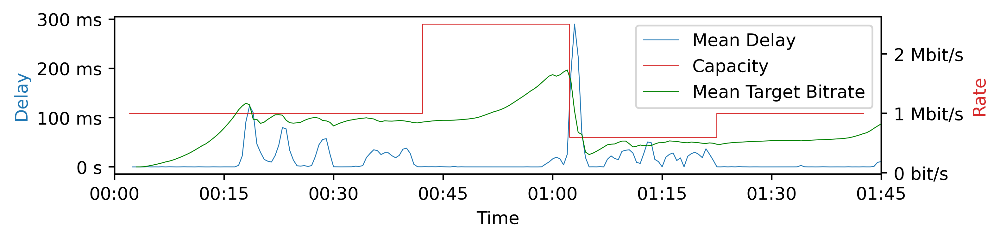

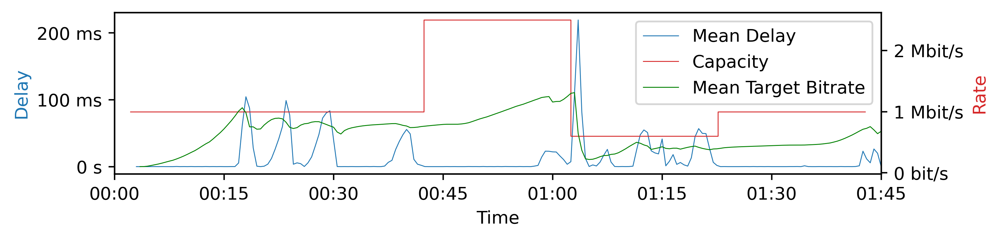

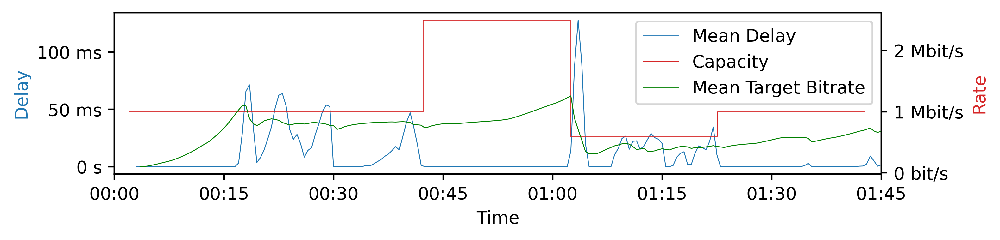

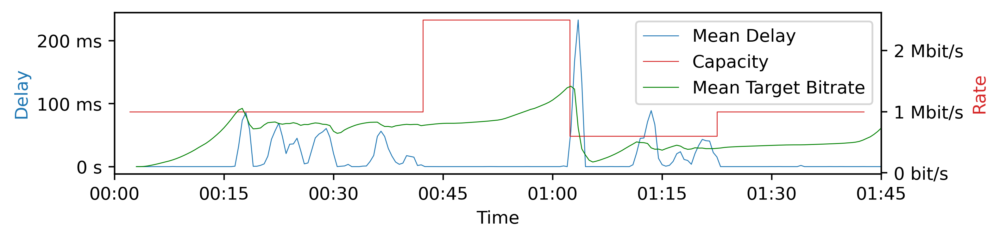

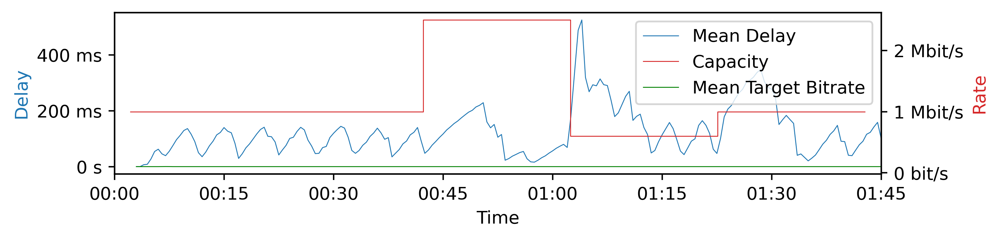

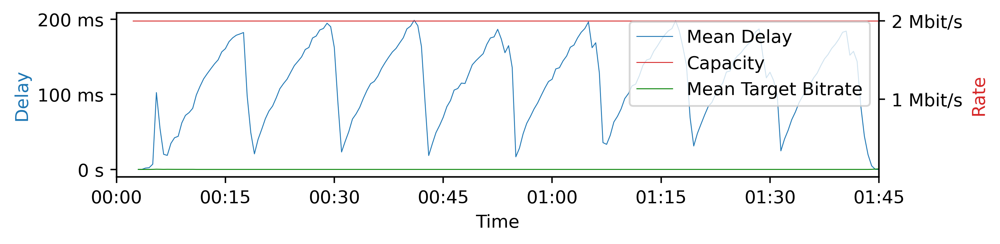

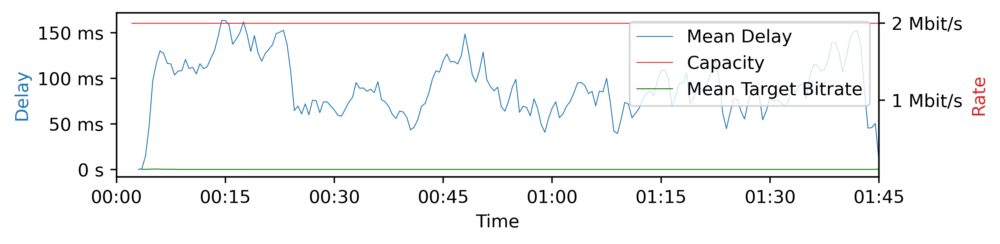

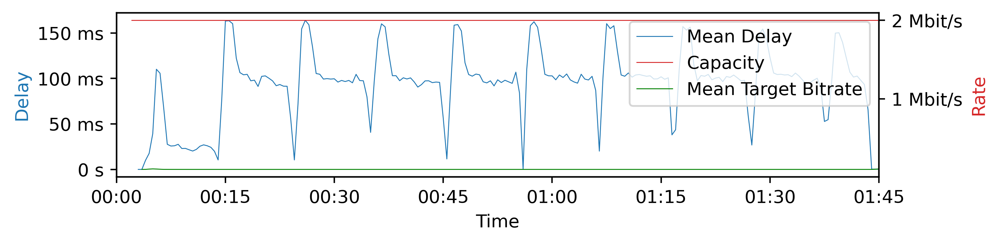

In [28]:
delay_plots = [
    {
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/sintel.y4m/leftrouter.log',
        'cc_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/sintel.y4m/forward_0/send_log/scream.log',
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-udp-scream/sintel.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-udp-scream.sintel.y4m.scream-delay.png')
    },
    {
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream/sintel.y4m/leftrouter.log',
        'cc_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream/sintel.y4m/forward_0/send_log/scream.log',
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream/sintel.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-scream.sintel.y4m.scream-delay.png')
    },
    {
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/leftrouter.log',
        'cc_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/forward_0/send_log/scream.log',
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-scream-local-feedback.sintel.y4m.scream-delay.png')
    },
    {
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno/sintel.y4m/leftrouter.log',
        'cc_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno/sintel.y4m/forward_0/send_log/scream.log',
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno/sintel.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-scream-newreno.sintel.y4m.scream-delay.png')
    },
    {
        'router_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno-stream/sintel.y4m/leftrouter.log',
        'cc_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno-stream/sintel.y4m/forward_0/send_log/scream.log',
        'config_filename': 'VariableAvailableCapacitySingleFlow50msOWD/rtp-over-quic-scream-newreno-stream/sintel.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow50msOWD.rtp-over-quic-scream-newreno-stream.sintel.y4m.scream-delay.png')
    },
    {
        'router_filename': 'MediaFlowCompetingWithALongTCPRenoFlow/rtp-over-quic-scream-newreno/sintel.y4m/leftrouter.log',
        'cc_filename': 'MediaFlowCompetingWithALongTCPRenoFlow/rtp-over-quic-scream-newreno/sintel.y4m/forward_0/send_log/scream.log',
        'config_filename': 'MediaFlowCompetingWithALongTCPRenoFlow/rtp-over-quic-scream-newreno/sintel.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'MediaFlowCompetingWithALongTCPRenoFlow.rtp-over-quic-scream-newreno.sintel.y4m.scream-delay.png')
    },
    {
        'router_filename': 'MediaFlowCompetingWithALongTCPCubicFlow/rtp-over-quic-scream-newreno/sintel.y4m/leftrouter.log',
        'cc_filename': 'MediaFlowCompetingWithALongTCPCubicFlow/rtp-over-quic-scream-newreno/sintel.y4m/forward_0/send_log/scream.log',
        'config_filename': 'MediaFlowCompetingWithALongTCPCubicFlow/rtp-over-quic-scream-newreno/sintel.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'MediaFlowCompetingWithALongTCPCubicFlow.rtp-over-quic-scream-newreno.sintel.y4m.scream-delay.png')
    },
    {
        'router_filename': 'MediaFlowCompetingWithALongTCPBBRFlow/rtp-over-quic-scream-newreno/sintel.y4m/leftrouter.log',
        'cc_filename': 'MediaFlowCompetingWithALongTCPBBRFlow/rtp-over-quic-scream-newreno/sintel.y4m/forward_0/send_log/scream.log',
        'config_filename': 'MediaFlowCompetingWithALongTCPBBRFlow/rtp-over-quic-scream-newreno/sintel.y4m/config.json',
        'dst_filename': os.path.join(plot_dir, 'MediaFlowCompetingWithALongTCPBBRFlow.rtp-over-quic-scream-newreno.sintel.y4m.scream-delay.png')
    },
]

for p in delay_plots:
    queue_delay(run_directories, p['config_filename'], p['router_filename'], p['cc_filename'], p['dst_filename'])

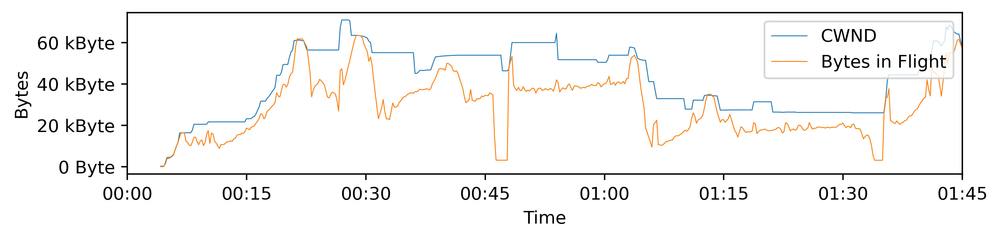

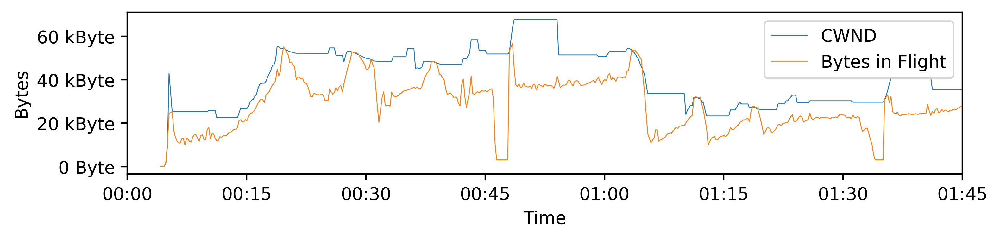

In [29]:
run = 'output/1644303115'
scream_cwnd_plots = [
    {
        'cc_file': os.path.join(run, 'VariableAvailableCapacitySingleFlow300msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/forward_0/send_log/scream.log'),
        'config': os.path.join(run, 'VariableAvailableCapacitySingleFlow300msOWD/rtp-over-quic-scream-local-feedback/sintel.y4m/config.json'),
        'group': 0,
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow300msOWD.rtp-over-quic-scream-local-feedback.sintel.y4m.scream-cwnd.png')
    },
    {
        'cc_file': os.path.join(run, 'VariableAvailableCapacitySingleFlow300msOWD/rtp-over-quic-scream/sintel.y4m/forward_0/send_log/scream.log'),
        'config': os.path.join(run, 'VariableAvailableCapacitySingleFlow300msOWD/rtp-over-quic-scream/sintel.y4m/config.json'),
        'group': 0,
        'dst_filename': os.path.join(plot_dir, 'VariableAvailableCapacitySingleFlow300msOWD.rtp-over-quic-scream.sintel.y4m.scream-cwnd.png'),
    },
]

for p in scream_cwnd_plots:
    fig, ax = plt.subplots(figsize=(8,2), dpi=400)
    labels = []
    ax.set_xlabel('Time')
    ax.set_ylabel('Bytes')
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%M:%S"))
    ax.yaxis.set_major_formatter(EngFormatter(unit='Byte'))
    ax.set_xlim([dt.datetime(1970, 1, 1), dt.datetime(1970, 1, 1, minute=1, second=45)])

    df = read_scream_cwnd(p)
    l0, = ax.plot(df.index, df['cwnd'], label='CWND', linewidth=0.5)
    l1, = ax.plot(df.index, df['bytes_in_flight'], label='Bytes in Flight', linewidth=0.5)
    labels.append(l0)
    labels.append(l1)

    lgd = ax.legend(handles = labels, loc='upper right', bbox_to_anchor=(1, 1))
    fig.tight_layout()
    fig.savefig(p['dst_filename'], bbox_extra_artists=(lgd,), bbox_inches='tight')